# PyVWF: Plotting research results for paper and comparison

In [1]:
# import time
# import xarray as xr
import numpy as np
import pandas as pd
import os

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib

pd.options.mode.chained_assignment = None  # default='warn'

bg_colour = '#f0f0f0'
custom_params = {'xtick.bottom': True, 'axes.edgecolor': 'black', 'axes.spines.right': False, 'axes.spines.top': False, 'mathtext.default': 'regular'}
sns.set_theme(style='ticks', rc=custom_params)

In [2]:
country = "DK" 
year_test = 2020 # year you wish to receive a time series for


# cluster_list = [1,2,5,7,10,20,50,70,100,200,500,700,1000,2000,3000,3300]
# cluster_list = [1,10,100,500,1000]
cluster_list = [1,2,5,7,10,20,50,70,100,200,500,700,800,900,1000,2000,3000,3300]
time_res_list = ['fixed', 'season', 'bimonth', 'month'] 
cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
add_nan = None # % to remove from data
interp_nan = None # monthly limit to interpretating NaN
fix_turb = None # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

# Specify where to make the new directory path
run = country+'-'+cluster_mode
if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
    # run += '-standard-scalar-equation'
    run += '-standard'
else:
    if add_nan != None:
        run += '-r'+str(add_nan)
    if interp_nan != None:
        run += '-i'+str(interp_nan)
    if fix_turb != None:
        run += '-'+fix_turb
# run = os.path.join('run/ARCHIVE',run)
run = os.path.join('run',run)
print(run)
# run = 'data-archive/data0028'
# run = 'data'

run/DK-onshore-standard


/var/folders/hb/8jmqlr8502jd4_jj817kmrq00000gn/T/ipykernel_25569/2684908630.py:76: FutureWarning:

Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.



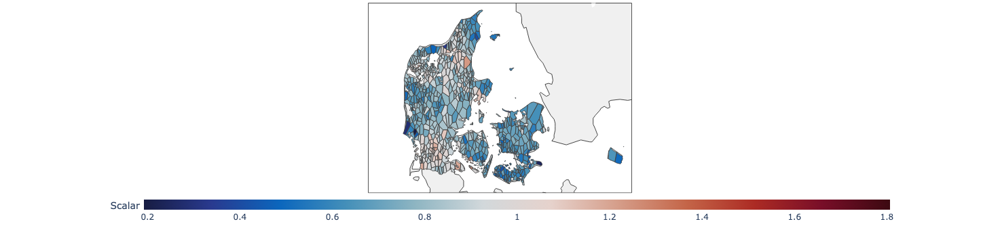

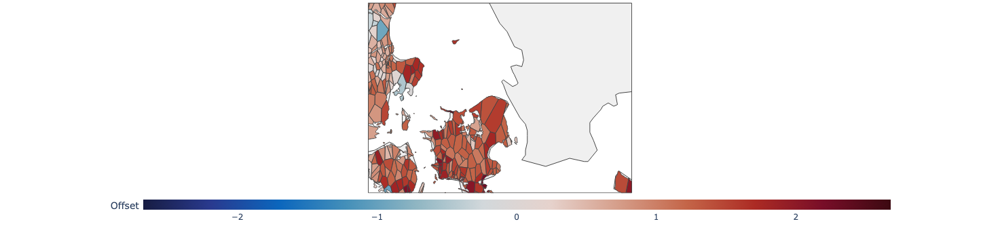

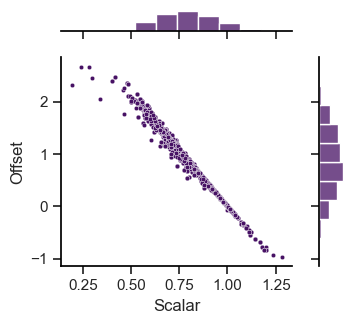

In [28]:
# trying out simons code
from scipy.spatial import Voronoi
import shapely
import matplotlib

def cluster_turbines(num_clu, turb_train, train=False, *args):
    # fitting clusters to training data
    kmeans = KMeans(
            init="random",
            n_clusters = num_clu,
            n_init = 10,
            max_iter = 300,
            random_state = 42
        )
    kmeans.fit(turb_train[['lat','lon']])
        
    if train == True:
        turb_train['cluster'] = kmeans.predict(turb_train[['lat','lon']])
        return kmeans, turb_train
    else:
        turb_info = args[0]
        turb_info['cluster'] = kmeans.predict(turb_info[['lat','lon']])
        return kmeans, turb_info

country='DK'
time_res = 'fixed'
num_clu = 700

turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
factors = pd.read_csv(run+'/training/correction-factors/'+country+'_factors_'+time_res+'_'+str(num_clu)+'.csv')

kmeans, df = cluster_turbines(num_clu, turb_info_train.copy(), False, turb_info_train[turb_info_train['type']=='onshore'].copy())
df = df.merge(factors[['cluster','scalar','offset']], on='cluster')

g = sns.jointplot(x="scalar",y="offset",data=df,
    s=10,marginal_kws=dict(bins=10),
    color='#471164FF'
)
g.fig.set_figwidth(3.7)
g.fig.set_figheight(3.4)
plt.ylabel('Offset')
plt.xlabel('Scalar')
plt.tight_layout()
plt.savefig(run+"/plots/offset_vs_scalar.png", bbox_inches='tight')

# Define extra points around the edge, otherwise the edge regions will go off to infinity
extra_points = np.array([
    [turb_info_train.lon.min() - 1, turb_info_train.lat.min() - 1],
    [turb_info_train.lon.min() - 1, turb_info_train.lat.max() + 1],
    [turb_info_train.lon.max() + 1, turb_info_train.lat.min() - 1],
    [turb_info_train.lon.max() + 1, turb_info_train.lat.max() + 1]
])
all_points = np.concatenate([kmeans.cluster_centers_[:,::-1], extra_points])

# Create voronoi polygons
vor = Voronoi(all_points)
lines = [
    shapely.geometry.LineString(vor.vertices[line])
    for line in vor.ridge_vertices
    if -1 not in line
]
voronoi_polygons = []
for poly in shapely.ops.polygonize(lines):
    voronoi_polygons.append(poly)

# Load coastline and regional data
    
# This I drew by hand, bounding Denmark
denmark_region_file = gpd.read_file(run+'/coastline/denmark_region.shp') 
denmark_polygon = shapely.geometry.Polygon(denmark_region_file.iloc[0].geometry)

# This is from global coastline data, so we can check for land
coastline_file = gpd.read_file(run+'/coastline/polygons.shp')

denmark_el = gpd.read_file(run+'/shapee/denmark_region.shp')
denmark_el.explode()
denmark_el = shapely.ops.unary_union(denmark_el.geometry)
# denmark_el

# Now we can use the Denmark and coastline polygons to crop the voronoi polygons to land
voronoi_polygons = [p.intersection(denmark_el) for p in voronoi_polygons]

# Get cluster IDs for each polygon
final_polygons = []
polygon_cluster_ids = []
for p in voronoi_polygons:
    # Some polygons have no area, so we need to catch the exception
    # Maybe this is something to do with offshore regions?
    try:
        polygon_centroid_lat = p.centroid.coords.xy[1][0]
        polygon_centroid_lon = p.centroid.coords.xy[0][0]
        polygon_centroid_df = pd.DataFrame({'lat': [polygon_centroid_lat], 'lon': [polygon_centroid_lon]})
        cluster = kmeans.predict(polygon_centroid_df)[0]
        final_polygons.append(p)
        polygon_cluster_ids.append(cluster)
    except:
        pass


gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["lon"], df["lat"], crs="EPSG:4326"),
).dissolve("cluster").reset_index()

gdf2 = gpd.GeoDataFrame(
    {'cluster':polygon_cluster_ids},
    geometry=final_polygons)

maps = gdf2.merge(gdf[['scalar','cluster','offset']], on="cluster")


fig = px.choropleth(
    maps,
    geojson=maps.geometry,
    locations=maps.index,
    color="scalar",
    color_continuous_scale='balance',
    color_continuous_midpoint=1
)
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),
    width = 465, height = 340,
    coloraxis_colorbar=dict(
        len=0.8,
        yanchor = 'top',
        y=0,
        thickness=15,
        orientation='h',
        title="Scalar"
))
fig.show()

fig = px.choropleth(
    maps,
    geojson=maps.geometry,
    locations=maps.index,
    color="offset",
    color_continuous_scale='balance',
    color_continuous_midpoint=0,
)
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)

fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),
    width = 465, height = 340,
    coloraxis_colorbar=dict(
        len=0.8,
        yanchor = 'top',
        y=0,
        thickness=15,
        orientation='h',
        title="Offset"
))
fig.show()

In [3]:
# import vwf.VWF_Model as model
# vwf_model = model.VWF(country, cluster_list, time_res_list, args[0], args[1], args[2])
# vwf_model.test(year_test,None)

In [4]:
def calc_error_fixed(type, df_sim, df_obs, turb_info, train=False):
    if train == True:
        df_obs = df_obs.pivot(
                index=['year','month'], 
                columns='ID', 
                values='obs').reset_index(drop=True)
        df_obs['time'] = np.arange(str(2015)+'-01', str(2019+1)+'-01', dtype='datetime64[M]')
        df_obs['month'] = df_obs.time.dt.month
        df_obs['year'] = df_obs.time.dt.year
        df_obs_monthly = df_obs.drop(columns=['time']).groupby(['year','month']).mean().reset_index()
        df_obs_monthly = df_obs_monthly.melt(id_vars=['year','month'], var_name='ID', value_name='cf')
    else:
        df_obs['time'] = pd.to_datetime(df_obs['time'])
        df_obs['month'] = df_obs.time.dt.month
        df_obs['year'] = df_obs.time.dt.year
        df_obs_monthly = df_obs.drop(columns=['time']).set_index('month').reset_index()
        df_obs_monthly = df_obs_monthly.melt(id_vars=['year','month'], var_name='ID', value_name='cf')
    
    df_sim['time'] = pd.to_datetime(df_sim['time'])
    df_sim['month'] = df_sim.time.dt.month
    df_sim['year'] = df_sim.time.dt.year
    df_sim_monthly = df_sim.drop(columns=['time']).groupby(['year','month']).mean().reset_index()
    df_sim_monthly = df_sim_monthly.melt(id_vars=['year','month'], var_name='ID', value_name='cf')

    turb_info['ID'] = turb_info['ID'].astype(str)
    df_obs_monthly['ID'] = df_obs_monthly['ID'].astype(str)
    df_sim_monthly['ID'] = df_sim_monthly['ID'].astype(str)
    
    merged = pd.merge(df_sim_monthly, df_obs_monthly, on=['ID', 'month', 'year'], suffixes=('_sim', '_obs'))
    if type == 'regional-error':
        merged = pd.merge(merged, turb_info[['ID', 'capacity','region', 'In training?']], on='ID')
    elif (type == 'cluster-error'):
        merged = pd.merge(merged, turb_info[['ID', 'capacity','cluster']], on='ID')
    elif (type == 'turbine-error'):
        merged = pd.merge(merged, turb_info[['ID', 'capacity','distance']], on='ID')
    elif type == 'monthly-error':
        merged = pd.merge(merged, turb_info[['ID', 'capacity','In training?']], on='ID')
    else:
        merged = pd.merge(merged, turb_info[['ID', 'capacity']], on='ID')
    
    
    merged = merged.dropna(subset=['cf_sim', 'cf_obs', 'capacity']).reset_index(drop=True)

    def weighted_avg(df, values, weights):
        return (df[values] * df[weights]).sum() / df[weights].sum()


    if type == 'monthly-error': # country-monthly
        wavg_obs = lambda x: weighted_avg(merged.loc[x.index], 'cf_obs', 'capacity')
        wavg_sim = lambda x: weighted_avg(merged.loc[x.index], 'cf_sim', 'capacity')
        count = lambda x: merged.loc[x.index]['ID'].count()
        averaged = merged.groupby(['month', 'In training?']).agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count}).reset_index().set_index('month')
        # averaged['diff'] = (np.abs(averaged['cf_sim'] - averaged['cf_obs'])/averaged['cf_obs']) * 100
        averaged['diff'] = (averaged['cf_sim'] - averaged['cf_obs'])

        averaged_total = merged.groupby(['month']).agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count})
        # averaged_total['diff'] = (np.abs(averaged_total['cf_sim'] - averaged_total['cf_obs'])/averaged_total['cf_obs'])*100
        averaged_total['diff'] = (averaged_total['cf_sim'] - averaged_total['cf_obs'])
        averaged_total['In training?'] = 'Both'

        averaged = pd.concat([averaged, averaged_total])
        
        be = averaged[['diff','In training?','ID']]
        return be

    
    elif type == 'regional-error': # region-yearly
        averaged = merged.groupby('ID').agg({'cf_obs': np.mean, 'cf_sim': np.mean, 'region': 'first', 'In training?': 'first', 'capacity':'first'}).reset_index()
        wavg_obs = lambda x: weighted_avg(averaged.loc[x.index], 'cf_obs', 'capacity')
        wavg_sim = lambda x: weighted_avg(averaged.loc[x.index], 'cf_sim', 'capacity')
        count = lambda x: averaged.loc[x.index]['ID'].count()
        averaged_type = averaged.groupby(['region','In training?']).agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count})
        averaged_type['diff'] = (np.abs(averaged_type['cf_sim'] - averaged_type['cf_obs'])/averaged_type['cf_obs'])*100
        # averaged_type['diff'] = np.abs(averaged_type['cf_sim'] - averaged_type['cf_obs'])
        averaged_type = averaged_type.reset_index().set_index('region')

        averaged_total = averaged.groupby('region').agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count})
        # averaged_total['diff'] = (np.abs(averaged_total['cf_sim'] - averaged_total['cf_obs'])/averaged_total['cf_obs'])*100
        averaged_total['diff'] = averaged_total['cf_sim'] - averaged_total['cf_obs']
        
        averaged_total['In training?'] = 'Both'
        
        averaged = pd.concat([averaged_type, averaged_total])
        be = averaged[['diff','In training?','ID','cf_obs','cf_sim']]
        return be
        
    elif type == 'turbine-error': # region-yearly
        averaged = merged.groupby('ID').mean()
        averaged['diff'] = averaged['cf_sim'] - averaged['cf_obs']
        # averaged['diff'] = (np.abs(averaged['cf_sim'] - averaged['cf_obs'])/averaged['cf_obs'])*100
        return averaged

    elif type == 'cluster-error': # cluster-yearly
        averaged = merged.groupby('ID').mean().reset_index()
        wavg_obs = lambda x: weighted_avg(averaged.loc[x.index], 'cf_obs', 'capacity')
        wavg_sim = lambda x: weighted_avg(averaged.loc[x.index], 'cf_sim', 'capacity')
        count = lambda x: averaged.loc[x.index]['ID'].count()
        averaged = averaged.groupby('cluster').agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count})
        averaged['diff'] = averaged['cf_sim'] - averaged['cf_obs']
        
        be = averaged['diff']
        return be, averaged['ID']
        
    elif type == 'temporal-focus': # country-monthly
        wavg_obs = lambda x: weighted_avg(merged.loc[x.index], 'cf_obs', 'capacity')
        wavg_sim = lambda x: weighted_avg(merged.loc[x.index], 'cf_sim', 'capacity')
        averaged = merged.groupby('month').agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim})
        averaged['diff'] = averaged['cf_sim'] - averaged['cf_obs']
        
        rmse = np.sqrt((averaged['diff']**2).mean())
        mae = np.abs(averaged['diff']).mean()
        mbe = averaged['diff'].mean()
        
    elif type == 'spatial-focus': # turbine-yearly
        averaged = merged.groupby('ID').mean()
        averaged['diff'] = averaged['cf_sim'] - averaged['cf_obs']
        averaged['sqdiff'] = averaged['diff']**2
        averaged['abdiff'] = np.abs(averaged['diff'])
        wavg_sq = lambda x: weighted_avg(averaged.loc[x.index], 'sqdiff', 'capacity')
        wavg_ab = lambda x: weighted_avg(averaged.loc[x.index], 'abdiff', 'capacity')
        wavg_diff = lambda x: weighted_avg(averaged.loc[x.index], 'diff', 'capacity')
        
        rmse = np.sqrt(averaged.agg({'sqdiff': wavg_sq}))
        mae = averaged.agg({'abdiff': wavg_ab})
        mbe = averaged.agg({'diff': wavg_diff})
        
    elif type == 'total':
        merged['diff'] = merged['cf_sim'] - merged['cf_obs']
        merged['abdiff'] = np.abs(merged['diff'])
        merged['sqdiff'] = merged['diff']**2
        merged = merged.groupby('ID').mean()
        wavg_sq = lambda x: weighted_avg(merged.loc[x.index], 'sqdiff', 'capacity')
        wavg_ab = lambda x: weighted_avg(merged.loc[x.index], 'abdiff', 'capacity')
        wavg_diff = lambda x: weighted_avg(merged.loc[x.index], 'diff', 'capacity')
        averaged = merged.agg({"sqdiff": wavg_sq, 'abdiff': wavg_ab, 'diff': wavg_diff})
        
        rmse = np.sqrt(averaged['sqdiff'])
        mae = averaged['abdiff']
        mbe = averaged['diff']

    return rmse, mae, mbe

def overall_error(type, run, country, turb_info, cluster_list, time_res_list, train, *args):
    rmse_all = []
    mae_all = []
    mbe_all = []
    cluster_all = []
    time_all = []
    
    if train == True:
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_unc_cf.csv', parse_dates=['time'])
    else:
        year_test = args[0]
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
    
    rmse, mae, mbe = calc_error_fixed(type, unc_cf, obs_cf, turb_info, train)
    
    rmse_all.append(rmse)
    mae_all.append(mae)
    mbe_all.append(mbe)
    cluster_all.append(1)
    time_all.append('uncorrected')
    
    for num_clu in cluster_list:
        for time_res in time_res_list:
            if train == True:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
            else:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
                
            rmse, mae, mbe = calc_error_fixed(type, cor_cf, obs_cf, turb_info, train)
            
            rmse_all.append(rmse)
            mae_all.append(mae)
            mbe_all.append(mbe)
            cluster_all.append(num_clu)
            time_all.append(time_res)
    
    
    df_metrics = pd.DataFrame(list(zip(np.ravel(cluster_all), np.ravel(time_all), np.ravel(rmse_all), np.ravel(mae_all), np.ravel(mbe_all))), 
                 columns =['num_clu', 'time_res', 'rmse', 'mae', 'mbe'])
    
    # if train == True:
    #     df_metrics.to_csv(run+'/results/'+country+'_train_metrics.csv', index = None)
    # else:
    #     df_metrics.to_csv(run+'/results/'+country+'_test_metrics.csv', index = None)
    return df_metrics


def explore_error(type, run, country, turb_info, cluster_list, time_res_list, train=False, *args):
    cf_all = []
    err_all = []
    cluster_all = []
    time_all = []
    type_all = []
    count_all = []
    
    
    if train == True:
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_unc_cf.csv', parse_dates=['time'])
    else:
        year_test = args[0]
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])


    if type == 'cluster-error' or type == 'turbine-error':

        print('not doing uncorrected')
        # error, count = calc_error_fixed(type, unc_cf, obs_cf, turb_info)
        
        # err_all.append(error)
        # cluster_all.append([1]*len(error))
        # time_all.append(['uncorrected']*len(error))
        # type_all.append(error.index)
        # count_all.append(count)
    
    else:
        error = calc_error_fixed(type, unc_cf, obs_cf, turb_info)

        if type == 'monthly-error' or type == 'regional-error':
            err_all.append(error)
            cluster_all.append([1]*len(error))
            time_all.append(['uncorrected']*len(error))
            type_all.append(error.index)
    
        else:
            cf_all.append(error['cf_sim'])
            cluster_all.append([1]*len(error))
            time_all.append(['uncorrected']*len(error))
            type_all.append(error.index)

    
    for num_clu in cluster_list:
        for time_res in time_res_list:
            if train == True:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
            else:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
            
            if type == 'cluster-error':
                error, count = calc_error_fixed(type, cor_cf, obs_cf, turb_info)
                
                err_all.append(error)
                cluster_all.append([num_clu]*len(error))
                time_all.append([time_res]*len(error))
                type_all.append(error.index)
                count_all.append(count)
                
            elif type == 'turbine-error':
                clus_info = pd.read_csv(run+'/training/simulated-turbines/DK_clus_info_'+str(num_clu)+'.csv')
                turb_info = closest_cluster(clus_info,turb_info)
                error, distance = calc_error_fixed(type, cor_cf, obs_cf, turb_info)
                
                err_all.append(error)
                cluster_all.append([num_clu]*len(error))
                time_all.append([time_res]*len(error))
                type_all.append(error.index)
                count_all.append(distance)
    
            else:
                error = calc_error_fixed(type, cor_cf, obs_cf, turb_info)
                if type == 'monthly-error' or type == 'regional-error' or type == 'turbine-error':
                    err_all.append(error)
                    cluster_all.append([num_clu]*len(error))
                    time_all.append([time_res]*len(error))
                    type_all.append(error.index)
            
                else:
                    cf_all.append(error['cf_sim'])
                    cluster_all.append([num_clu]*len(error))
                    time_all.append([time_res]*len(error))
                    type_all.append(error.index)
    

    if type == 'region_month':
        df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(type2_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(cf_all))), 
                     columns =['region', 'month' ,'num_clu', 'time_res', 'cf'])
    elif type == 'monthly-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(err_all))), 
                 columns =['month','num_clu', 'time_res', 'diff'])
    elif type == 'regional-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(err_all))), 
                 columns =['region','num_clu', 'time_res', 'diff'])
    elif type == 'cluster-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(count_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(err_all))), 
                 columns =['cluster','count','num_clu', 'time_res', 'diff'])
    elif type == 'turbine-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(count_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(err_all))), 
                 columns =['ID', 'distance', 'num_clu', 'time_res', 'diff'])
    else:
        df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(cf_all))), 
                 columns =['month','num_clu', 'time_res', 'cf'])

    return df_metrics





def cluster_turbines(num_clu, turb_train, train=False, *args):
    # fitting clusters to training data
    kmeans = KMeans(
            init="random",
            n_clusters = num_clu,
            n_init = 10,
            max_iter = 300,
            random_state = 42
        )
    kmeans.fit(turb_train[['lat','lon']])
        
    if train == True:
        turb_train['cluster'] = kmeans.predict(turb_train[['lat','lon']])
        return turb_train
    else:
        turb_info = args[0]
        turb_info['cluster'] = kmeans.predict(turb_info[['lat','lon']])
        turb_info['distance'] = kmeans.transform(turb_info[['lat','lon']]).min(axis=1)
        return turb_info
        
# def cluster_turbines(mode, num_clu, turb_train, train=False, *args):
#     # fitting clusters to training data
#     if mode != 'all':
#         if mode == 'onshore':
#             mode_fix = 'offshore'
#         elif mode == 'offshore':
#             mode_fix = 'onshore'
            
#         if num_clu == 1:
#             if train == True:
#                 turb_train['cluster'] = 0
#                 return turb_train
#             else:
#                 turb_info = args[0]
#                 turb_info['cluster'] = 0
#                 turb_info['distance'] = 0
#                 return turb_info
                
#         else:
#             kmeans = KMeans(
#                 init="random",
#                 n_clusters = num_clu-1,
#                 n_init = 10,
#                 max_iter = 300,
#                 random_state = 42
#             )
#             turb_set = turb_train[turb_train['type'] == mode][['lat','lon']]
#             kmeans.fit(turb_set)
            
#             if train == True:
#                 turb_train['cluster'] = kmeans.predict(turb_train[['lat','lon']])
#                 turb_train.loc[turb_train['type'] == mode_fix, ['cluster']] = num_clu-1
#                 return turb_train
#             else:
#                 turb_info = args[0]
#                 turb_info['cluster'] = kmeans.predict(turb_info[['lat','lon']])
#                 turb_info['distance'] = kmeans.transform(turb_info[['lat','lon']]).min(axis=1)
#                 turb_info.loc[turb_info['type'] == mode_fix, ['cluster']] = num_clu-1
#                 return turb_info
                
#     elif mode == 'all':
#         kmeans = KMeans(
#             init="random",
#             n_clusters = num_clu,
#             n_init = 10,
#             max_iter = 300,
#             random_state = 42
#         )
#         kmeans.fit(turb_train[['lat','lon']])
        
#         if train == True:
#             turb_train['cluster'] = kmeans.predict(turb_train[['lat','lon']])
#             return turb_train
#         else:
#             turb_info = args[0]
#             turb_info['cluster'] = kmeans.predict(turb_info[['lat','lon']])
#             return turb_info



def uncor_error(type, run, country, turb_info, cluster_list, time_res_list, train=True, *args):
    obs_all = []
    sim_all = []
    err_all = []
    cluster_all = []
    time_all = []
    type_all = []
    count_all = []
    offshore_all = []
    
    
    if train == True:
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_unc_cf.csv', parse_dates=['time'])
    else:
        year_test = args[0]
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])


    
    
    if type == 'regional-error':
        error = calc_error_fixed(type, unc_cf, obs_cf, turb_info, train)
        err_all.append(error['diff'])
        obs_all.append(error['cf_obs'])
        sim_all.append(error['cf_sim'])
        cluster_all.append([1]*len(error['diff']))
        time_all.append(['uncorrected']*len(error['diff']))
        type_all.append(error.index)
        offshore_all.append(error['In training?'])
        count_all.append(error['ID'])
    elif type == 'monthly-error':
        error = calc_error_fixed(type, unc_cf, obs_cf, turb_info, train)
        err_all.append(error['diff'])
        cluster_all.append([1]*len(error['diff']))
        time_all.append(['uncorrected']*len(error['diff']))
        offshore_all.append(error['In training?'])
        type_all.append(error.index)

    # elif type == 'turbine-error':
    #     err_all.append(error['diff'])
    #     cluster_all.append([1]*len(error['diff']))
    #     time_all.append(['uncorrected']*len(error['diff']))
    #     type_all.append(error.index)
    #     count_all.append(error['distance'])


    for num_clu in cluster_list:
        for time_res in time_res_list:
            if train == True:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
            else:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])


            if type == 'regional-error':
                error = calc_error_fixed(type, cor_cf, obs_cf, turb_info, train)
                err_all.append(error['diff'])
                obs_all.append(error['cf_obs'])
                sim_all.append(error['cf_sim'])
                cluster_all.append([num_clu]*len(error['diff']))
                time_all.append([time_res]*len(error['diff']))
                type_all.append(error.index)
                offshore_all.append(error['In training?'])
                count_all.append(error['ID'])
                
            elif type == 'monthly-error':
                error = calc_error_fixed(type, cor_cf, obs_cf, turb_info, train)
                err_all.append(error['diff'])
                cluster_all.append([num_clu]*len(error['diff']))
                time_all.append([time_res]*len(error['diff']))
                offshore_all.append(error['In training?'])
                type_all.append(error.index)
                count_all.append(error['ID'])

            elif type == 'turbine-error':
                turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
                clus_info = cluster_turbines(num_clu, turb_info_train, False, turb_info)
                error = calc_error_fixed(type, cor_cf, obs_cf, clus_info, False)
                err_all.append(error['diff'])
                cluster_all.append([num_clu]*len(error['diff']))
                time_all.append([time_res]*len(error['diff']))
                type_all.append(error.index)
                count_all.append(error['distance'])
                
    if type == 'monthly-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(offshore_all), np.ravel(type_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(err_all))), 
                 columns =['In training?','month','num_clu', 'time_res', 'diff'])
    elif type == 'regional-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(offshore_all), np.ravel(type_all), np.ravel(count_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(obs_all), np.ravel(sim_all), np.ravel(err_all))), 
                 columns =['In training?','region','count','num_clu', 'time_res','obs','sim','diff'])
    elif type == 'turbine-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(count_all), np.ravel(err_all))), 
                 columns =['ID','num_clu', 'time_res','distance','diff'])

    return df_metrics

# Analysing Input Data

In [5]:
turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
train_obs = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')

turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
test_obs = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
turb_info['In training?'] = np.where(turb_info.ID.isin(turb_info_train.ID), 'Yes', 'No')

### Training analysis

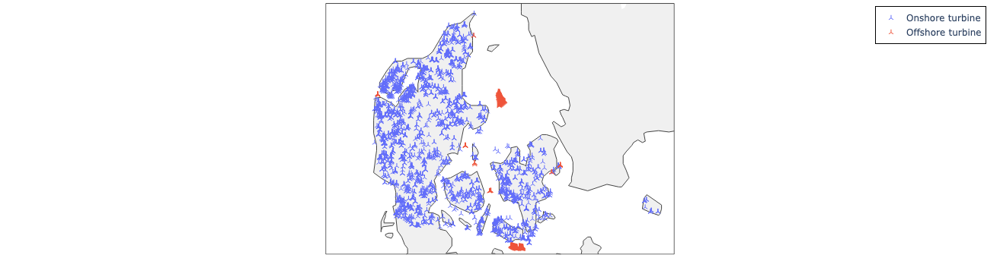

In [20]:
# Plot of where all the turbines used in training are located
fig = px.scatter_geo(turb_info_train,lat='lat',lon='lon',color='type')

fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
# capitalise 
fig.for_each_trace(lambda t: t.update(name = t.name.title()+' turbine'))
fig.update_traces(marker=dict(size=5, symbol="y-up-open"))
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),width = 465, height = 340,
    legend=dict(orientation="v", yanchor="top", y=0.99, xanchor="right", x=0.99, bordercolor="Black",borderwidth=1, title=None),
    # legend_title_side='top center',legend_title_text='Type'
)
fig.show()

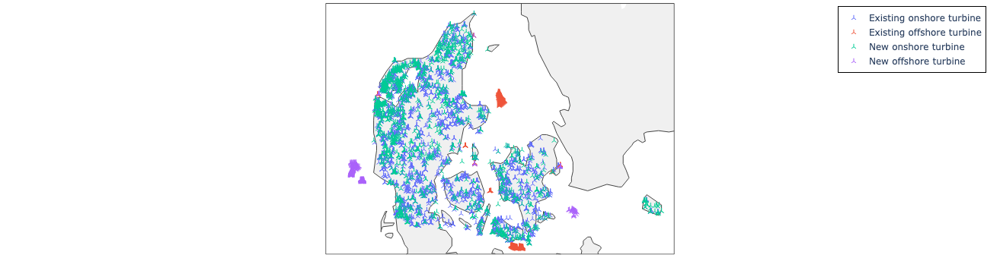

In [17]:
turb_info.loc[(turb_info['type'] == 'onshore') & (turb_info['In training?'] == 'Yes'), 'In training?'] = 'Existing onshore turbine'
turb_info.loc[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'Yes'), 'In training?'] = 'Existing offshore turbine'
turb_info.loc[(turb_info['type'] == 'onshore') & (turb_info['In training?'] == 'No'), 'In training?'] = 'New onshore turbine'
turb_info.loc[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'No'), 'In training?'] = 'New offshore turbine'
# turb_info = turb_info.sort_values('In training?', ascending=True)

# Plot of where all the turbines used in training are located
fig = px.scatter_geo(turb_info,lat='lat',lon='lon',color = 'In training?', category_orders={'In training?':['Existing onshore turbine','Existing offshore turbine','New onshore turbine','New offshore turbine']})#,color_orders={"In Training?": ["Yes (onshore)","Yes (offshore)", "No (onshore)", "No (offshore)"]})

fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_traces(marker=dict(size=5, symbol="y-up-open"))
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),width = 465, height = 340,
    legend=dict(orientation="v", yanchor="top", y=0.99, xanchor="right", x=0.99, bordercolor="Black",borderwidth=1, title=None),
    # legend_title_side='top center' 
)

fig.show()

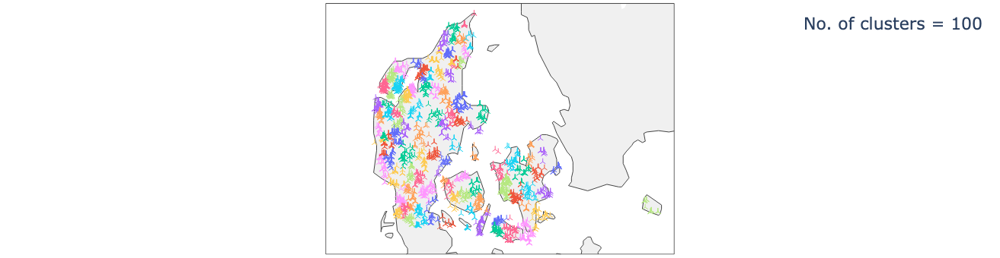

In [5]:
from vwf.bias_correction import (
    cluster_turbines
)

# clus_info_train = cluster_turbines(2, turb_info_train, True)
clus_info_train = cluster_turbines(100, turb_info_train, True)

clus_info_train["cluster"] = clus_info_train["cluster"].astype(str)
fig = px.scatter_geo(clus_info_train, lat ='lat',lon ='lon', 
                     color = 'cluster', symbol='type', symbol_map={'onshore':'y-up-open', 'offshore':'y-up-open'},
)
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)

fig.add_annotation(
    x=0.99, y=0.98, # position
    text=r'No. of clusters = 100',
    showarrow=False,
    font=dict(
                # color="black",
                size=22
            ),
    borderpad=4,
    bgcolor="white",
)
# {'In Training?':['onshore':y-up-open, 'offshore':circle]}
# fig.update_traces(marker=dict(size=5, symbol=['y-up-open','circle']))
# fig.update_traces(marker=dict(size=5))

fig.update(layout_coloraxis_showscale=False, layout_showlegend=False)
fig.update_layout(margin=dict(l=5, r=5, t=5, b=5),width = 465, height = 340)
fig.show()

### ERA 5 Bias Analysis

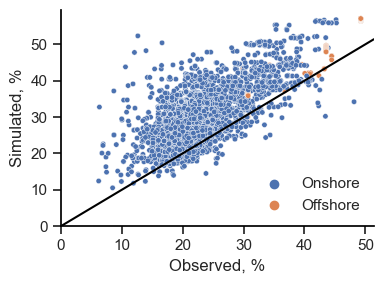

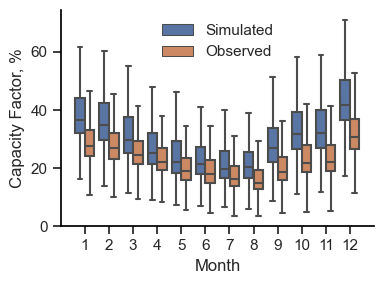

In [52]:
gen_train = pd.read_csv(run+'/training/'+country+'_train_gen_cf.csv')
gen_train['ID'] = gen_train['ID'].astype(str)
turb_info_train['ID'] = turb_info_train['ID'].astype(str)
gen_train = gen_train.merge(turb_info_train[['ID','type']], on='ID')

comp_total = gen_train.groupby(['ID','type']).agg({"sim": np.mean, "obs": np.mean}).reset_index()
comp_total['obs'] = comp_total['obs']*100
comp_total['sim'] = comp_total['sim']*100


fig, axes = plt.subplots(1, figsize=(4, 3))

sns.scatterplot(x="obs",y="sim",data=comp_total, s=15, marker='o',hue='type',ax=axes) # color='#471164FF'
axes.set_ylabel('Simulated, %')
axes.set_xlabel('Observed, %')
axes.set_xlim(0)
axes.set_ylim(0)
x0, x1 = axes.get_xlim()
y0, y1 = axes.get_ylim()
lims = [max(x0, y0), min(x1, y1)]
axes.plot(lims, lims, 'black')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, ['Onshore', 'Offshore'], ncol=1, frameon=False)

plt.tight_layout()
plt.savefig(run+'/plots/era5_'+country+'_train_bias.png', bbox_inches='tight')

comp_month = gen_train.groupby(['ID','month']).agg({"sim": np.mean, "obs": np.mean}).reset_index()
comp_month = comp_month.melt(id_vars=['ID','month'], var_name="model", value_name="cf")
comp_month['cf'] = comp_month['cf']*100

fig, axes = plt.subplots(1, figsize=(4, 3))
sns.boxplot(data=comp_month,x="month", y="cf", hue="model",showfliers = False,ax=axes)
axes.set_ylabel('Capacity Factor, %')
axes.set_xlabel('Month')
axes.set_xlim(-1,12)
axes.set_ylim(0)

handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, ['Simulated', 'Observed'], ncol=1, loc='upper center' , frameon=False)
# plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.25, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
plt.tight_layout()
plt.savefig(run+'/plots/era5_'+country+'_train_monthly.png', bbox_inches='tight')

In [241]:
def regional_cf(regions, num_clu, time_res, turb_info, turb_base, test=False):
    def regional_info(regions,turb_info, turb_base, remove=None):
        # create the regional index
        kmeans = KMeans(
                    init="random",
                    n_clusters = regions,
                    n_init = 10,
                    max_iter = 300,
                    random_state = 42
                )
        kmeans.fit(turb_base[['lat','lon']])
        
        # adding cluster labels to data
        turb_info['region_delete'] = kmeans.predict(turb_info[['lat','lon']])
        
        # order the clusters/labels from left to right
        region_info = turb_info.groupby('region_delete', as_index=False)[['lat','lon']].mean()
        region_info = region_info.sort_values('lon').reset_index(drop=True)
        region_info['region'] = region_info.index
        turb_info = turb_info.merge(region_info[['region_delete','region']], on='region_delete',how='left')
        turb_info = turb_info.drop('region_delete',axis=1)
    
        if remove == 'new_offshore':
        ## Use this to filter out offshore etc for plotting
            turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'No')].index).reset_index(drop=True)
        elif remove == 'all_offshore':
            turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore')].index).reset_index(drop=True)
        # turb_info = turb_info.drop(turb_info[(turb_info['In training?'] == 'No')].index).reset_index(drop=True)
        return turb_info
    
    turb_info = regional_info(regions, turb_info, turb_base)
    
    ## Use this to filter out offshore etc for plotting
    # turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'No')].index).reset_index(drop=True)
    # turb_info = turb_info.drop(turb_info[(turb_info['In training?'] == 'No')].index).reset_index(drop=True)

    region_info = turb_info.copy()

    def weighted_region_cf(df, turb_info, name):
        df = df.melt(
                id_vars=["time"], # adding in turbine ID for merging
                var_name="ID", 
                value_name=name
            )
        
        df["ID"] = df["ID"].astype(str)
        turb_info["ID"] = turb_info["ID"].astype(str)

        ## Use this to filter out offshore etc for plotting
        df = df.loc[df['ID'].isin(turb_info['ID'])].reset_index(drop=True)
        
        df_all = df.copy()
        df = df.merge(turb_info[['ID','region','capacity','lat','lon']],on='ID')
    
        def weighted_avg(df, values, weights):
                return (df[values] * df[weights]).sum() / df[weights].sum()
    
        wavg = lambda x: weighted_avg(df.loc[x.index], name, 'capacity')

        df_region = df.groupby('region').agg({name: wavg, 'lat': np.mean, 'lon': np.mean})
        return df_region, df_all
    
    # loading files
    obs = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
    unc = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
    obs_weighted, obs_all = weighted_region_cf(obs, turb_info, 'obs')
    unc_weighted, unc_all = weighted_region_cf(unc, turb_info, 'unc')

    if test == True:
        def load_cf(num_clu, time_res, year_test=2020):
            cor = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
            return cor
            
        cor = load_cf(num_clu, time_res)
        cor_one = load_cf(1, 'fixed')
        cor_weighted, cor_all = weighted_region_cf(cor, turb_info, 'cor')
        cor_one_weighted, cor_one_all = weighted_region_cf(cor_one, turb_info, 'cor-base')

        all_cf = obs_all.merge(unc_all,on=['ID', 'time']).merge(cor_all,on=['ID', 'time']).merge(cor_one_all,on=['ID', 'time'])
        all_cf = all_cf.merge(turb_info[['ID','lat','lon','capacity']],on='ID')
        weighted_region = obs_weighted.merge(unc_weighted[['unc']],on=['region']).merge(cor_weighted[['cor']],on=['region']).merge(cor_one_weighted[['cor-base']],on=['region'])

    else: 
        all_cf = obs_all.merge(unc_all,on=['ID', 'time'])
        all_cf = all_cf.merge(turb_info[['ID','lat','lon','capacity']],on='ID')
        weighted_region = obs_weighted.merge(unc_weighted[['unc']],on=['region'])
    
    # # return weighted_region, all_cf, region_info
    region_cf = weighted_region.reset_index().melt(id_vars=['region','lat','lon'],var_name="model",value_name="cf")

    region_cf['cf'] = region_cf['cf']*100
    
    return region_cf, all_cf, region_info

base_clu = 700
base_freq = 'fixed'
mapped_cf, ignore, ignore = regional_cf(8, base_clu, base_freq, turb_info[turb_info['type'] == 'onshore'], turb_info_train[turb_info_train['type'] == 'onshore'], True)

/var/folders/hb/8jmqlr8502jd4_jj817kmrq00000gn/T/ipykernel_6011/3783979360.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



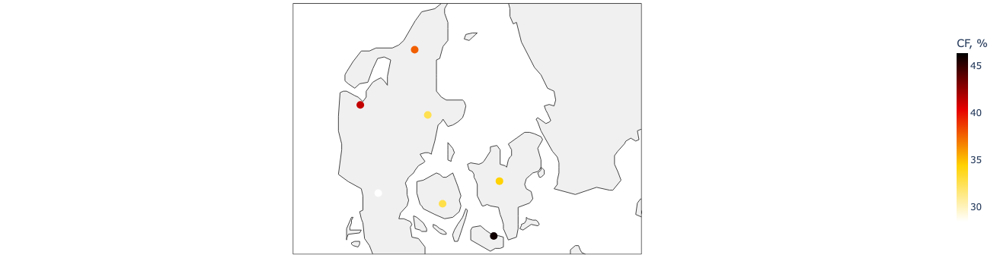

In [243]:
param = 'unc' # choose between 'unc', 'cor', obs'

fig = px.scatter_geo(
    mapped_cf[mapped_cf['model']==param],
    lat='lat',
    lon='lon', 
    color = 'cf',
    color_continuous_scale='hot_r', 
    # range_color=(10,60)
) 
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_traces(marker=dict(size=10, opacity=1))
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),
    width = 465, height = 340,
    coloraxis_colorbar=dict(len=0.8,thickness=15)
)
fig.layout.coloraxis.colorbar.title = 'CF, %'
fig.show()

### Exploring Error Plots

In [6]:
# temporal_metrics = overall_error('temporal-focus', run, country, turb_info, cluster_list, time_res_list, False, 2020)
# spatial_metrics = overall_error('spatial-focus', run, country, turb_info, cluster_list, time_res_list, False, 2020)
# total_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)
train_metrics = overall_error('total', run, country, turb_info_train, cluster_list, time_res_list, True)

# temporal_metrics = overall_error('temporal-focus', run, country, turb_info[turb_info['type'] == 'onshore'], cluster_list, time_res_list, False, 2020)
# spatial_metrics = overall_error('spatial-focus', run, country, turb_info[turb_info['type'] == 'onshore'], cluster_list, time_res_list, False, 2020)
# total_metrics = overall_error('total', run, country, turb_info[turb_info['type'] == 'onshore'], cluster_list, time_res_list, False, 2020)
# train_metrics = overall_error('total', run, country, turb_info_train[turb_info_train['type'] == 'onshore'], cluster_list, time_res_list, True)

Saved to run/DK-onshore-standard/plots/DK_train_error.png



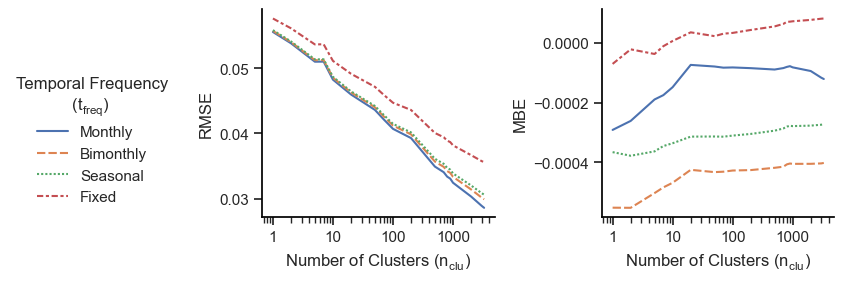

In [22]:
# all generic types of error
def plot_overall_error(run, country, df_metrics, name):
    # fig, axes = plt.subplots(1, 2, figsize=(6.67, 3)) # for normal
    fig, axes = plt.subplots(1, 2, figsize=(6.8, 3)) # for train with the legend
    
    sns.lineplot(
        x='num_clu',
        y='rmse',
        hue ="time_res",
        style="time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        data = df_metrics[(df_metrics['time_res'] != 'uncorrected')],
        ax = axes[0],
        legend = False
    )
    axes[0].set_xscale('log')
    axes[0].set_ylabel('RMSE')
    axes[0].set_xlabel('Number of Clusters ($n_{clu}$)')
    axes[0].set_xticks([1, 10, 100,1000])
    axes[0].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    
    sns.lineplot(
        x='num_clu',
        y='mbe',
        hue ="time_res",
        style= "time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        data = df_metrics[(df_metrics['time_res'] != 'uncorrected')],
        ax = axes[1],
        legend = True
    )
    
    axes[1].set_xscale('log')
    axes[1].set_ylabel('MBE')
    axes[1].set_xlabel('Number of Clusters ($n_{clu}$)')
    axes[1].set_xticks([1, 10, 100,1000])
    axes[1].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

   
    
    # fig.suptitle(name)
    axes[1].get_legend().remove()
    handles, labels = plt.gca().get_legend_handles_labels()
    labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Fixed'] # renaming labels
    # plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.4, 0.5), title='$t_{freq}$')
    # plt.legend(handles, labels, ncol=4, loc='upper left', bbox_to_anchor=(0, 1), title='$t_{freq}$')
    # plt.figlegend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 1.2), ncol=4, title='Temporal Frequency ($t_{freq}$)')
    plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.25, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
    # plt.figlegend(handles, labels, loc = 'center right', bbox_to_anchor=(1.15, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
    plt.tight_layout()
    plt.savefig(run+'/plots/'+country+'_'+name+'_error.png', bbox_inches='tight')
    return print("Saved to "+str(run+'/plots/'+country+'_'+name+'_error.png')+"\n")



plot_overall_error(run, country, train_metrics, 'train')
# plot_overall_error(run, country, total_metrics, 'full')
# plot_overall_error(run, country, temporal_metrics, 'temporal_focus')
# plot_overall_error(run, country, spatial_metrics, 'spatial_focus')

In [11]:
# plotting modified errors

cluster_list = [1,10,100,500,1000]
time_res_list = ['fixed', 'season', 'bimonth', 'month'] 
country = "DK" 
year_test = 2020 # year you wish to receive a time series for

cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
add_nan = None # % to remove from data
interp_nan = None # monthly limit to interpretating NaN
fix_turb = None # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

run = country+'-'+cluster_mode
if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
    # run += '-standard-scalar-equation'
    run += '-standard'
else:
    if add_nan != None:
        run += '-r'+str(add_nan)
    if interp_nan != None:
        run += '-i'+str(interp_nan)
    if fix_turb != None:
        run += '-'+fix_turb
run = os.path.join('run',run)
turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
original_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)
# ################################################################################################################################################
# ################################################################################################################################################
# cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
# add_nan = 0.3 # % to remove from data
# interp_nan = None # monthly limit to interpretating NaN
# fix_turb = None # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

# run = country+'-'+cluster_mode
# if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
#     # run += '-standard-scalar-equation'
#     run += '-standard'
# else:
#     if add_nan != None:
#         run += '-r'+str(add_nan)
#     if interp_nan != None:
#         run += '-i'+str(interp_nan)
#     if fix_turb != None:
#         run += '-'+fix_turb
# run = os.path.join('run',run)
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
# missing30_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)

# ################################################################################################################################################
# ################################################################################################################################################
# cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
# add_nan = 0.5 # % to remove from data
# interp_nan = None # monthly limit to interpretating NaN
# fix_turb = None # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

# run = country+'-'+cluster_mode
# if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
#     # run += '-standard-scalar-equation'
#     run += '-standard'
# else:
#     if add_nan != None:
#         run += '-r'+str(add_nan)
#     if interp_nan != None:
#         run += '-i'+str(interp_nan)
#     if fix_turb != None:
#         run += '-'+fix_turb
# run = os.path.join('run',run)
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
# missing50_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)

# ################################################################################################################################################
# ################################################################################################################################################
# cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
# add_nan = None # % to remove from data
# interp_nan = None # monthly limit to interpretating NaN
# fix_turb = 'Vestas.V66.2000' # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

# run = country+'-'+cluster_mode
# if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
#     # run += '-standard-scalar-equation'
#     run += '-standard'
# else:
#     if add_nan != None:
#         run += '-r'+str(add_nan)
#     if interp_nan != None:
#         run += '-i'+str(interp_nan)
#     if fix_turb != None:
#         run += '-'+fix_turb
# run = os.path.join('run',run)
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
# trained_vestas_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)

# ################################################################################################################################################
# ################################################################################################################################################
# cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
# add_nan = None # % to remove from data
# interp_nan = None # monthly limit to interpretating NaN
# fix_turb = 'GE.1.5se' # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

# run = country+'-'+cluster_mode
# if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
#     # run += '-standard-scalar-equation'
#     run += '-standard'
# else:
#     if add_nan != None:
#         run += '-r'+str(add_nan)
#     if interp_nan != None:
#         run += '-i'+str(interp_nan)
#     if fix_turb != None:
#         run += '-'+fix_turb
# run = os.path.join('run',run)
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
# trained_ge_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)

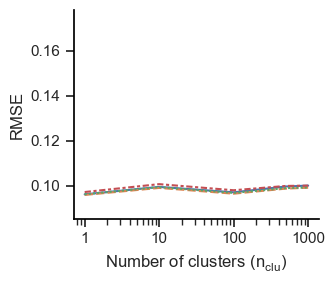

In [12]:
def plot_single_error(metric, name, country, df_metrics, add_legend):
    if add_legend == True:
        fig, axes = plt.subplots(1, figsize=(3.3, 3))
    else:
        fig, axes = plt.subplots(1, figsize=(3.5, 3))
    
    sns.lineplot(
        x='num_clu',
        y=metric,
        hue ="time_res",
        style= "time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        data = df_metrics[(df_metrics['time_res'] != 'uncorrected')],
        ax = axes,
        legend = add_legend
    )
    
    axes.set_xscale('log')
    axes.set_ylabel(metric.upper())
    axes.set_xlabel('Number of clusters ($n_{clu}$)')
    axes.set_xticks([1, 10, 100,1000])
    axes.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    axes.set_ylim(0.085,0.178)
    

    if add_legend == True:
        axes.get_legend().remove()
        handles, labels = plt.gca().get_legend_handles_labels()
        labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Fixed'] # renaming labels
        # plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.445, 0.5), title='$t_{freq}$')
        plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.25, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
    
    plt.tight_layout()
    plt.savefig('run/paper-plot/'+country+'_'+name+'_test_rmse.png', bbox_inches='tight')
    
# plot_single_error('rmse', 'original', country, original_metrics, False)
# plot_single_error('rmse', 'miss30', country, missing30_metrics, False)
# plot_single_error('rmse', 'miss50', country, missing50_metrics, False)
# plot_single_error('rmse', 'trainvestas', country, trained_vestas_metrics, False)
# plot_single_error('rmse', 'trainge', country, trained_ge_metrics, False)
plot_single_error('rmse', 'testvestas', country, original_metrics, False)

# plot_single_error('rmse', 'train_rmse', country, train_metrics, True)
# plot_overall_error(run, country, train_metrics, 'train')

In [15]:
train_metrics

,num_clu,time_res,rmse,mae,mbe
0,1,uncorrected,0.099042,0.078002,0.071838
1,1,fixed,0.057586,0.044043,-0.000071
2,1,season,0.055807,0.042761,-0.000366
3,1,bimonth,0.055697,0.042699,-0.000553
4,1,month,0.055526,0.042574,-0.000292
...,...,...,...,...,...
68,3000,month,0.028917,0.019665,-0.000117
69,3300,fixed,0.035594,0.025582,0.000082
70,3300,season,0.030626,0.020819,-0.000273
71,3300,bimonth,0.029918,0.020395,-0.000403


In [25]:
# monthly diff of the temporal errors
turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
train_obs = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')

turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
test_obs = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
turb_info['In training?'] = np.where(turb_info.ID.isin(turb_info_train.ID), 'Yes', 'No')

monthly_diff = uncor_error('monthly-error', run, country, turb_info, [1,700,2000], time_res_list, False, 2020)
train_monthly_diff = uncor_error('monthly-error', run, country, turb_info_train,[1],['fixed'], True)

diff_diff = train_monthly_diff[((train_monthly_diff['time_res'] == 'uncorrected')) & (train_monthly_diff['type'] == 'onshore')]
diff_diff['diff_diff'] = np.abs(train_monthly_diff[((train_monthly_diff['time_res'] == 'uncorrected')) & (train_monthly_diff['type'] == 'onshore')]['diff']-monthly_diff[((monthly_diff['time_res'] == 'uncorrected')) & (monthly_diff['type'] == 'onshore')]['diff'])
# diff_diff

plt.figure(figsize=(4,2.8))
base_clu = 1
sns.lineplot(
    x='month',y='diff',
    data = train_monthly_diff[((train_monthly_diff['time_res'] == 'uncorrected')) & (train_monthly_diff['type'] == 'onshore')],
    color = '#471164FF', linestyle='--', label='Train (2015-2019)',
    legend = True
)
sns.lineplot(
    x='month',y='diff',
    data = monthly_diff[((monthly_diff['time_res'] == 'uncorrected')) & (monthly_diff['type'] == 'onshore')],
    color = '#471164FF', label='Test (2020)',
    legend = True
)

# sns.lineplot(
#     x='month',y='diff_diff',
#     data = diff_diff[((diff_diff['time_res'] == 'uncorrected')) & (diff_diff['type'] == 'onshore')],
#     color = 'b', linestyle='dotted', label='DIFFFFFF',
#     legend = True
# )

handles, labels = plt.gca().get_legend_handles_labels()
plt.ylabel('Percentage Error, %')
plt.xlabel('Month')
# plt.ylim(0,80)
plt.xticks(range(1,13))
plt.legend(handles, labels, ncol=1, loc='best')
plt.tight_layout()
# plt.savefig(run+'/plots/'+country+'_monthly_difference_unc.png', bbox_inches='tight')

KeyError: "['In training?'] not in index"

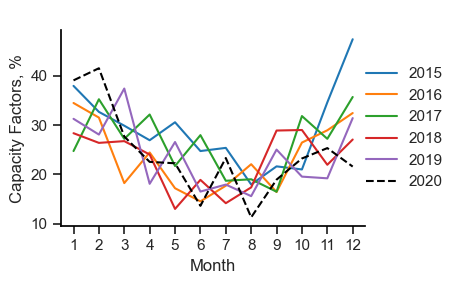

In [45]:
def wavg_cf_monthly(df, turb_info):
    """
    Calculates the weighted monthly capacity factor by capacity.
    
    Args:
        df (pandas.DataFrame): time-series of capacity factors for turbines/farms
        turb_info (pandas.DataFrame): turbine metadata including height and coordinates
        
    Returns:
        series: weighted average of capacity factor for dataframe
    """
    df = df.groupby(pd.Grouper(key='time',freq='M')).mean()
    df = df.reset_index()
    df = df.melt(
            id_vars=["time"], # adding in turbine ID for merging
            var_name="ID", 
            value_name="cf"
        )
    
    df["ID"] = df["ID"].astype(str)
    turb_info["ID"] = turb_info["ID"].astype(str)
    df = pd.merge(df, turb_info[['ID','capacity']], on=['ID'], how='left')

    def weighted_avg(df, values, weights):
            return (df[values] * df[weights]).sum() / df[weights].sum()

    wavg = lambda x: weighted_avg(df.loc[x.index], 'cf', 'capacity')
    
    df = df.groupby(pd.Grouper(key='time',freq='M')).agg({"cf": wavg})
    return df.reset_index()

def wavg_cf_monthly_train(df, turb_info):  
    df["ID"] = df["ID"].astype(str)
    turb_info["ID"] = turb_info["ID"].astype(str)
    df = pd.merge(df, turb_info[['ID','capacity']], on=['ID'], how='left')

    def weighted_avg(df, values, weights):
            return (df[values] * df[weights]).sum() / df[weights].sum()

    wavg = lambda x: weighted_avg(df.loc[x.index], 'cf', 'capacity')
    
    df = df.groupby(['month']).agg({"cf": wavg})
    
    return df.reset_index()

obs_cf_test = wavg_cf_monthly(test_obs, turb_info)
obs_cf_test['year'] = pd.DatetimeIndex(obs_cf_test['time']).year
obs_cf_test['month'] = pd.DatetimeIndex(obs_cf_test['time']).month
obs_cf_test = obs_cf_test.drop('time',axis=1)[['year','month','cf']]
obs_cf_test['cf'] = obs_cf_test['cf'] * 100

gen_train = pd.read_csv(run+'/training/'+country+'_train_gen_cf.csv')
gen_train["ID"] = gen_train["ID"].astype(str)
turb_info_train["ID"] = turb_info_train["ID"].astype(str)
gen_train = pd.merge(gen_train, turb_info_train[['ID','capacity']], on=['ID'], how='left')

def weighted_avg(df, values, weights):
        return (df[values] * df[weights]).sum() / df[weights].sum()
    
wavg = lambda x: weighted_avg(gen_train.loc[x.index], 'sim', 'capacity')
wavg2 = lambda x: weighted_avg(gen_train.loc[x.index], 'obs', 'capacity')

comp_month = gen_train.groupby(['year','month']).agg({"sim": wavg, "obs": wavg2}).reset_index()
comp_month['sim'] = comp_month['sim']*100
comp_month['obs'] = comp_month['obs']*100

df_sim = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
df_sim['time'] = pd.to_datetime(df_sim['time'])
df_sim['month'] = df_sim.time.dt.month
df_sim_monthly = df_sim.drop(columns=['time']).groupby(['month']).mean().reset_index()
df_sim_monthly = df_sim_monthly.melt(id_vars=['month'], var_name='ID', value_name='cf')

df_sim_monthly = pd.merge(df_sim_monthly, turb_info_train[['ID','capacity']], on=['ID'], how='left')

def weighted_avg(df, values, weights):
        return (df[values] * df[weights]).sum() / df[weights].sum() *100
    
wavg = lambda x: weighted_avg(df_sim_monthly.loc[x.index], 'cf', 'capacity')

df_sim_monthly = df_sim_monthly.groupby('month').agg({"cf": wavg}).reset_index()

plt.figure(figsize=(5,3))

sns.lineplot(
    x= "month", y= "obs", data = comp_month,hue='year',estimator = 'mean', errorbar='sd', legend = True, palette="tab10"
    )

sns.lineplot(
    x= "month", y= "cf", data = obs_cf_test,
    legend = True, color = 'black', label ='2020',linestyle='--'
)
# sns.lineplot(
#     x= "month", y= "sim", data = comp_month, estimator = 'mean', errorbar='sd',
#     color='g', label='Sim (2015-2019)', legend = True)
# sns.lineplot(
#     x= "month", y= "cf", data = df_sim_monthly, estimator = 'mean', errorbar='sd',
#     color='r', label='Sim (2020)', legend = True)

handles, labels = plt.gca().get_legend_handles_labels()
plt.ylabel('Capacity Factors, %')
plt.xlabel('Month')
plt.xlim(0.5, 12.5)
plt.xticks(range(1,13))
plt.title(' ')
# plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.25, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
plt.legend(handles, labels, ncol=1, loc='center right', frameon=False, bbox_to_anchor=(1.3, 0.5))
plt.tight_layout()
plt.savefig(run+'/plots/'+country+'_obs_cf.png', bbox_inches='tight')

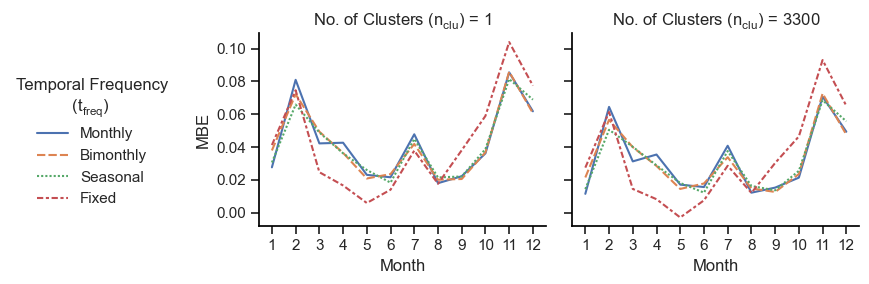

In [137]:
def plot_monthly_error(run, country, df_metrics):
    base_clu = 1
    fig, axes = plt.subplots(1,2, figsize=(7, 3),sharey='all')
    sns.lineplot(
        x='month',y='diff',
        data = df_metrics[((df_metrics['num_clu'] == base_clu) & (df_metrics['time_res'] != 'uncorrected')) & (df_metrics['In training?'] == 'Both')],
        hue ="time_res",style="time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        ax = axes[0],legend = False
    )

    sns.lineplot(
        x='month',y='diff',
        data = df_metrics[((df_metrics['num_clu'] == 3300)) & (df_metrics['In training?'] == 'Both')],
        hue ="time_res",style="time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        ax = axes[1],legend = True
    )
    # sns.lineplot(
    #     x='month',y='diff',
    #     data = df_metrics[((df_metrics['num_clu'] == base_clu) | (df_metrics['time_res'] == 'uncorrected')) & (df_metrics['type'] == 'onshore')],
    #     hue ="time_res",style="time_res",
    #     hue_order = ['month', 'bimonth', 'season', 'fixed', 'uncorrected'],
    #     style_order= ['month', 'bimonth', 'season', 'fixed', 'uncorrected'],
    #     ax = axes[1],legend = False
    # )
    # sns.lineplot(
    #     x='month',y='diff',
    #     data = df_metrics[((df_metrics['num_clu'] == base_clu) | (df_metrics['time_res'] == 'uncorrected')) & (df_metrics['type'] == 'offshore')],
    #     hue ="time_res",style="time_res",
    #     hue_order = ['month', 'bimonth', 'season', 'fixed', 'uncorrected'],
    #     style_order= ['month', 'bimonth', 'season', 'fixed', 'uncorrected'],
    #     ax = axes[2],legend = True
    # )
    
    axes[0].set_ylabel('MBE')
    axes[0].set_xlabel('Month')
    axes[0].set_xticks(range(1,13))
    axes[0].set_title(r'No. of Clusters ($n_{clu}$) = 1')
    axes[1].set_ylabel('MBE')
    axes[1].set_xlabel('Month')
    axes[1].set_xticks(range(1,13))
    axes[1].set_xticks(range(1,13))
    # axes[1].set_ylim(0,80)
    axes[1].set_title(r'No. of Clusters ($n_{clu}$) = 3300')
    # axes[2].set_ylabel('Absolute Error')
    # axes[2].set_xlabel('Month')
    # axes[2].set_xticks(range(1,13))
    # axes[2].set_title('Offshore')
    
    # fixing the legend labels and sharing it over whole plot.
    axes[1].get_legend().remove()
    handles, labels = plt.gca().get_legend_handles_labels()
    labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Fixed'] # renaming labels
    # plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.5, 0.5), title='Temporal Frequency ($t_{freq}$)')
    # plt.figlegend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 1.2), ncol=5, title='Temporal Frequency ($t_{freq}$)')
    plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.25, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
    # plt.figlegend(handles, labels, loc = 'center right', bbox_to_anchor=(1.15, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
    plt.tight_layout()
    plt.savefig(run+'/plots/'+country+'_monthly_difference.png', bbox_inches='tight')
    return plt.tight_layout()
    
# monthly_diff = uncor_error('monthly-error', run, country, turb_info, [1,700,3300], time_res_list, False, 2020)
plot_monthly_error(run, country, monthly_diff)

In [50]:
turb_info

,ID,type,capacity,diameter,height,lon,lat,model,p_density,In training?
0,570714700000000027,onshore,225,27.0,30.0,12.509767,55.636178,Vestas.V27.225,392.975168,Yes
1,570714700000000034,onshore,225,27.0,30.0,12.511312,55.636599,Vestas.V27.225,392.975168,Yes
2,570714700000000041,onshore,600,44.0,50.0,12.620408,55.697791,Bonus.B44.600,394.599032,Yes
3,570714700000000058,onshore,600,44.0,50.0,12.622368,55.697650,Bonus.B44.600,394.599032,Yes
4,570714700000000065,onshore,600,44.0,50.0,12.625381,55.697498,Bonus.B44.600,394.599032,Yes
...,...,...,...,...,...,...,...,...,...,...
4829,571313174116016241,onshore,10,7.1,21.5,11.979214,55.976207,Vestas.V100.2000,252.576779,Yes
4830,571313174116025533,onshore,25,13.0,18.0,12.519681,56.037194,Goldwind.GW140.3000,188.349045,No
4831,571313174116253585,onshore,850,52.0,44.0,12.097564,55.686324,Vestas.V52.850,400.241721,No
4832,571313174116620486,onshore,25,13.0,18.0,12.210560,55.881580,Goldwind.GW140.3000,188.349045,No


### Spatial Impact

In [130]:
spatial_metrics = overall_error('spatial-focus', run, country, turb_info, cluster_list, time_res_list, False, 2020)
turb_old = turb_info.loc[turb_info['In training?'] == 'Yes'].copy().reset_index(drop=True)
total_old_metrics = overall_error('spatial-focus', run, country, turb_old, cluster_list, time_res_list, False, 2020)
turb_new = turb_info.loc[turb_info['In training?'] == 'No'].copy().reset_index(drop=True)
total_new_metrics = overall_error('spatial-focus', run, country, turb_new, cluster_list, time_res_list, False, 2020)

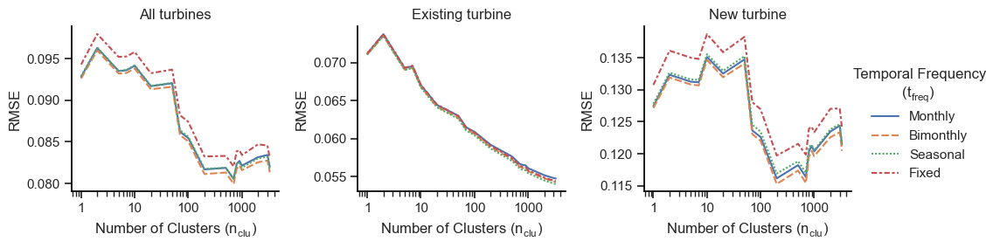

In [131]:
# spatial plotting
fig, axes = plt.subplots(1, 3, figsize=(10, 3))
sns.lineplot(
    x='num_clu',
    y='rmse',
    hue ="time_res",
    style="time_res",
    hue_order = ['month', 'bimonth', 'season', 'fixed'],
    style_order= ['month', 'bimonth', 'season', 'fixed'],
    data = spatial_metrics[(spatial_metrics['time_res'] != 'uncorrected')],
    ax = axes[0],
    legend = False
)

axes[0].set_title('All turbines')
axes[0].set_xscale('log')
axes[0].set_ylabel('RMSE')
axes[0].set_xlabel('Number of Clusters ($n_{clu}$)')
axes[0].set_xticks([1, 10, 100,1000])
axes[0].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

sns.lineplot(
    x='num_clu',
    y='rmse',
    hue ="time_res",
    style="time_res",
    hue_order = ['month', 'bimonth', 'season', 'fixed'],
    style_order= ['month', 'bimonth', 'season', 'fixed'],
    data = total_old_metrics[(total_old_metrics['time_res'] != 'uncorrected')],
    ax = axes[1],
    legend = False
)
axes[1].set_title('Existing turbine')
axes[1].set_xscale('log')
axes[1].set_ylabel('RMSE')
axes[1].set_xlabel('Number of Clusters ($n_{clu}$)')
axes[1].set_xticks([1, 10, 100,1000])
axes[1].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

sns.lineplot(
    x='num_clu',
    y='rmse',
    hue ="time_res",
    style= "time_res",
    hue_order = ['month', 'bimonth', 'season', 'fixed'],
    style_order= ['month', 'bimonth', 'season', 'fixed'],
    data = total_new_metrics[(total_new_metrics['time_res'] != 'uncorrected')],
    ax = axes[2],
    legend = True
)

axes[2].set_title('New turbine')
axes[2].set_xscale('log')
axes[2].set_ylabel('RMSE')
axes[2].set_xlabel('Number of Clusters ($n_{clu}$)')
axes[2].set_xticks([1, 10, 100,1000])
axes[2].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())



# fig.suptitle(name)
axes[2].get_legend().remove()
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Fixed'] # renaming labels
# plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.4, 0.5), title='$t_{freq}$')
# plt.legend(handles, labels, ncol=4, loc='upper left', bbox_to_anchor=(0, 1), title='$t_{freq}$')
# plt.figlegend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 1.2), ncol=4, title='Temporal Frequency ($t_{freq}$)')
plt.figlegend(handles, labels, loc = 'center right', bbox_to_anchor=(1.15, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
plt.tight_layout()
plt.savefig(run+'/plots/'+country+'_spatial_separate_test_error.png', bbox_inches='tight')

region
0    1414
2     826
1     809
6     527
3     472
5     375
4     364
7      47
Name: count, dtype: int64


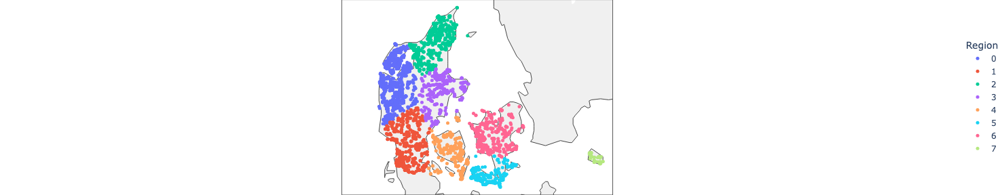

In [121]:
def regional_info(regions,turb_info, turb_base, remove=None):
    # create the regional index
    kmeans = KMeans(
                init="random",
                n_clusters = regions,
                n_init = 10,
                max_iter = 300,
                random_state = 42
            )
    kmeans.fit(turb_base[['lat','lon']])
    
    # adding cluster labels to data
    turb_info['region_delete'] = kmeans.predict(turb_info[['lat','lon']])
    # turb_info['distance'] = kmeans.transform(turb_info[['lat','lon']]).min(axis=1)
    
    # order the clusters/labels from left to right
    region_info = turb_info.groupby('region_delete', as_index=False)[['lat','lon']].mean()
    region_info = region_info.sort_values('lon').reset_index(drop=True)
    region_info['region'] = region_info.index
    turb_info = turb_info.merge(region_info[['region_delete','region']], on='region_delete',how='left')
    turb_info = turb_info.drop('region_delete',axis=1)

    if remove == 'new_offshore':
    ## Use this to filter out offshore etc for plotting
        turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'No')].index).reset_index(drop=True)
    elif remove == 'all_offshore':
        turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore')].index).reset_index(drop=True)
    # turb_info = turb_info.drop(turb_info[(turb_info['In training?'] == 'No')].index).reset_index(drop=True)
    
    # X_dist = kmeans.transform(turb_info[['lat','lon']])**2
    # df = pd.DataFrame(X_dist.sum(axis=1).round(2), columns=['sqdist'])
    # turb_info['sqdist'] = turb_info['sqdist']
    
    return turb_info

regions = 8
region_info_test = regional_info(regions, turb_info[turb_info['type']=='onshore'].copy(), turb_info_train[turb_info_train['type'] == 'onshore'].copy())
region_info_test['region'] = region_info_test['region'].astype(str)

fig = px.scatter_geo(region_info_test, lat ='lat',lon ='lon', color = 'region', category_orders={"region": ["0","1", "2", "3", "4", "5","6","7", "8","9","10","11"]})
print(region_info_test.region.value_counts())
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_traces(marker=dict(size=5))

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),width = 384, height = 288,
    # legend=dict(orientation="h", yanchor="bottom", y=1.01, xanchor="center", x=0.5, title="Region",
    legend=dict(orientation="v", yanchor="middle", y=0.5, xanchor="left", x=1.01, title="Region",
    
    # bordercolor="Black",borderwidth=1
    ),legend_title_side='top center' 
)
fig.show()

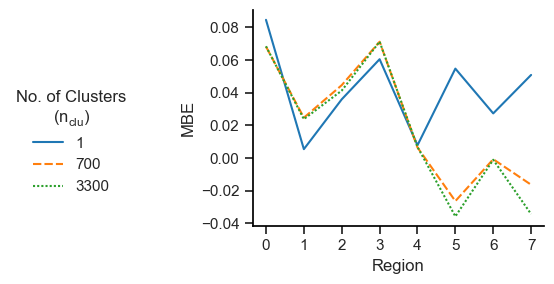

In [128]:
def plot_regional_error(run, country, df_metrics):
    # metric = 'rmse' # choose between 'mae', 'rmse'
    base_clu = 1
    choice_clu = 1
    choice_clu2 = 700
    choice_clu3 = 3300
    fig, axes = plt.subplots(1, figsize=(4, 3),sharey='all')
    sns.lineplot(
        x='region',y='diff',
        data = df_metrics[((df_metrics['time_res'] == 'fixed') & (df_metrics['In training?'] =='Both')) & ((df_metrics['num_clu'] == base_clu) | (df_metrics['num_clu'] == choice_clu) | (df_metrics['num_clu'] == choice_clu2)| (df_metrics['num_clu'] == choice_clu3))],
        hue ="num_clu",style="num_clu",palette="tab10",
        ax = axes,
        legend = True
    )

    # sns.lineplot(
    #     x='region',y='diff',
    #     data = df_metrics[((df_metrics['time_res'] == 'fixed') & (df_metrics['In training?'] =='Yes')) & ((df_metrics['num_clu'] == base_clu) | (df_metrics['num_clu'] == choice_clu) | (df_metrics['num_clu'] == choice_clu2)| (df_metrics['num_clu'] == choice_clu3))],
    #     hue ="num_clu",style="num_clu",palette="tab10",
    #     ax = axes[1],
    #     legend = False
    # )

    # sns.lineplot(
    #     x='region',y='diff',
    #     data = df_metrics[((df_metrics['time_res'] == 'fixed') & (df_metrics['In training?'] =='Both')) & ((df_metrics['num_clu'] == base_clu) | (df_metrics['num_clu'] == choice_clu) | (df_metrics['num_clu'] == choice_clu2)| (df_metrics['num_clu'] == choice_clu3))],
    #     hue ="num_clu",style="num_clu",palette="tab10",
    #     ax = axes[2],
    #     legend = True
    # )

    axes.set_xticks(range(0,8))
    # axes[0].set_title('All turbines')
    axes.set_ylabel('MBE')
    # axes[0].set_ylabel('Absolute Error')
    axes.set_xlabel('Region')

    
    # axes[0].set_xticks(range(0,8))
    # # axes[0].set_title('All turbines')
    # axes[0].set_ylabel('Percentage Error, %')
    # # axes[0].set_ylabel('Absolute Error')
    # axes[0].set_xlabel('Region')

    # axes[1].set_xticks(range(0,8))
    # # axes[1].set_title('Existed in training')
    # # axes[1].set_ylabel('Absolute Error')
    # axes[1].set_xlabel('Region')

    # axes[2].set_xticks(range(0,8))
    # # axes[2].set_title('Not in training')
    # # axes[2].set_ylabel('Absolute Error')
    # axes[2].set_xlabel('Region')
    
    # fixing the legend labels and sharing it over whole plot.
    axes.get_legend().remove()
    handles, labels = plt.gca().get_legend_handles_labels()
    # labels = ['1', '10','1000']
    # plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.3, 0.5), title='Number of Clusters ($n_{clu}$)')
    # plt.figlegend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 1.2), ncol=4, title='Number of Clusters ($n_{clu}$)', frameon=False)
    # plt.figlegend(handles, labels, loc = 'center right', bbox_to_anchor=(1.1, 0.5), ncol=1, title='No. of Clusters\n        ($n_{clu}$)', frameon=False)
    plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.4, 0.5), ncol=1, title='No. of Clusters\n        ($n_{clu}$)', frameon=False)

    plt.tight_layout()
    plt.savefig(run+'/plots/'+country+'_regional_difference.png', bbox_inches='tight')
    return plt.tight_layout()

# region_info_test = regional_info(regions, turb_info, turb_info_train.copy())
region_error = uncor_error('regional-error', run, country, region_info_test, [1,700,3300], ['fixed'], False, 2020)
plot_regional_error(run, country, region_error)

In [102]:
regions = 8
number_clu = 2

# turbine errors
turb_error_test = uncor_error('turbine-error', run, country, turb_info.copy(), [number_clu], ['fixed'], False, 2020)
turb_error_test['ID'] = turb_error_test['ID'].astype(str)
turb_error_test['turb_err'] =  np.abs(turb_error_test['diff'])

# regional labels & error
# region_info_test = regional_info(regions, turb_info[turb_info['type']=='onshore'].copy(), turb_info_train[turb_info_train['type'] == 'onshore'].copy())
region_info_test = regional_info(regions, turb_info.copy(), turb_info_train.copy())
region_info_test['ID'] = region_info_test['ID'].astype(str)
plot_error = pd.merge(turb_error_test, region_info_test[['ID', 'capacity','region']], on='ID')
region_sum_cap = region_info_test.groupby('region')['capacity'].sum().reset_index()
region_sum_cap.columns = 'region', 'max_capacity_region'
plot_error = pd.merge(plot_error, region_sum_cap, on='region')

# cluster info that the training is done on and merged onto the test info
clus_info_train = cluster_turbines(number_clu, turb_info_train, True)
clus_info_test = cluster_turbines(number_clu, turb_info_train, False, turb_info.copy())
clus_info_test['ID'] = clus_info_test['ID'].astype(str)


def weighted_avg(df, values, weights):
    return (df[values] * df[weights]).sum() / df[weights].sum()

wavg_capacity = lambda x: weighted_avg(clus_info_train.loc[x.index], 'capacity', 'capacity')
wavg_height = lambda x: weighted_avg(clus_info_train.loc[x.index], 'height', 'capacity')
wavg_density = lambda x: weighted_avg(clus_info_train.loc[x.index], 'p_density', 'capacity')
wavg_diameter = lambda x: weighted_avg(clus_info_train.loc[x.index], 'diameter', 'capacity')
# weighted_clusters = clus_info_train.groupby('cluster').agg({'capacity': wavg_capacity, 'height': wavg_height, 'p_density': wavg_density, 'diameter': wavg_diameter}).reset_index()

weighted_clusters = clus_info_train.groupby('cluster')[['capacity','height','p_density','diameter']].mean().reset_index()
weighted_clusters.columns = 'cluster', 'clu_capacity', 'clu_height', 'clu_density', 'clu_diameter'
plot_error = pd.merge(plot_error, clus_info_test[['ID', 'cluster','lat','lon','In training?','height','p_density','diameter']], on='ID')
plot_error = pd.merge(plot_error, weighted_clusters, on='cluster')

# calculating the errors
# plot_error['err_height'] = ((plot_error['height']-plot_error['clu_height'])/(plot_error['clu_height']))*100
# plot_error['err_density'] = ((plot_error['p_density']-plot_error['clu_density'])/(plot_error['clu_density']))*100
# plot_error['err_capacity'] = ((plot_error['capacity']-plot_error['clu_capacity'])/(plot_error['clu_capacity']))*100
# plot_error['err_diameter'] = ((plot_error['diameter']-plot_error['clu_diameter'])/(plot_error['diameter']))*100
plot_error['err_capacity'] = (np.abs(plot_error['clu_capacity']-plot_error['capacity'])/((plot_error['clu_capacity']+plot_error['capacity'])/2))*100
plot_error['err_height'] = (np.abs(plot_error['clu_height']-plot_error['height'])/((plot_error['clu_height']+plot_error['height'])/2))*100
plot_error['err_density'] = (np.abs(plot_error['clu_density']-plot_error['p_density'])/((plot_error['clu_density']+plot_error['p_density'])/2))*100
plot_error['err_diameter'] = (np.abs(plot_error['clu_diameter']-plot_error['diameter'])/((plot_error['clu_diameter']+plot_error['diameter'])/2))*100

# plot_error['relative_error_region'] = ((plot_error['turb_err'])*plot_error['capacity'])/plot_error['max_capacity_region']
# plot_error['err_relative'] = (plot_error['turb_err']*plot_error['capacity'])/ (clus_info_test[clus_info_test['type']=='onshore'])['capacity'].sum()

plot_melt = plot_error[['ID','err_capacity','distance','err_height','err_diameter','err_diameter','turb_err','In training?']].melt(id_vars=['ID','turb_err', 'In training?'], var_name='error_type', value_name='percs')

479.3801601781567 240.13063787456863
333.474541585324 145.54247488256325
239.40733182609074 117.05187115039719
0.7663849637450394 0.6230592923713641


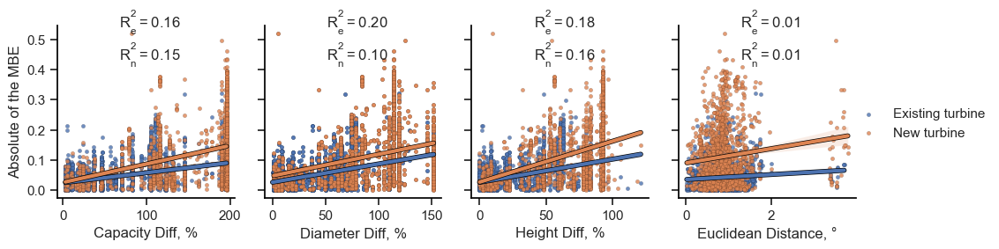

In [120]:
import scipy as sp
import matplotlib.patheffects as pe

g = sns.lmplot(data=plot_melt,x='percs',y='turb_err',
            hue='In training?', col="error_type",col_order=['err_capacity','err_diameter','err_height','distance'], 
            # x_bins=10,x_ci=None, ci=99,
            markers='o',
            truncate=True,
            facet_kws=dict(sharex=False, sharey=True),
            line_kws=dict(linewidth=3,path_effects=[pe.withStroke(linewidth=4,
                                                        foreground="black")]),
            scatter_kws=dict(linewidth=0.1,edgecolor='black',s=10),
            height=3, aspect=0.83,
               n_boot=1000,
               
)

g.axes[0,0].set_ylabel('Absolute of the MBE')
g.axes[0,0].set_xlabel('Capacity Diff, %')
g.axes[0,1].set_xlabel('Diameter Diff, %')
g.axes[0,2].set_xlabel('Height Diff, %')
g.axes[0,3].set_xlabel('Euclidean Distance, °')
g.set_titles(col_template='')
labels=['Existing turbine', 'New turbine']
g._legend.set_title(None)
g._legend.texts[0].set_text(labels[0])
g._legend.texts[1].set_text(labels[1])
sns.move_legend(g, "center right", bbox_to_anchor=(1.05, 0.5))


for ax, feature in zip(g.axes.flat, g.col_names):
    slope, intercept, r_value, p_value, std_err = sp.stats.linregress(plot_error[plot_error['In training?']=='Yes']['turb_err'], plot_error[plot_error['In training?']=='Yes'][feature])
    slope2, intercept, r_value2, p_value, std_err = sp.stats.linregress(plot_error[plot_error['In training?']=='No']['turb_err'], plot_error[plot_error['In training?']=='No'][feature])
    print(slope,slope2)
    ax.text(.35, .8, '$R_e^2=${:.2f}\n$R_n^2=${:.2f}'.format(r_value**2, r_value2**2),
            transform=ax.transAxes)


# def annotate(data, **kws):
#     r, p = sp.stats.pearsonr(data['turb_err'], data['percs'])
#     print(r)
#     ax = plt.gca()
#     ax.text(.1, .8, 'r={:.3f}, r={:.3f}'.format(r[0],r[1]),
#             transform=ax.transAxes)
# g.map_dataframe(annotate)

g.savefig(run+'/plots/'+country+'_spatial_error_correlation.png', bbox_inches='tight')
# plt.show(g)

In [145]:
plot_error

['err_capacity', 'err_diameter', 'err_height', 'distance']

In [163]:
from scipy.stats import spearmanr
import scipy.stats
import scipy as sp
from sklearn.metrics import r2_score


### Exploring patterns in the bias-correction factors

In [ ]:
from sklearn.cluster import KMeans
import geopandas as gpd

def cluster_turbines(num_clu, turb_train, train=False, *args):
    # fitting clusters to training data
    kmeans = KMeans(
            init="random",
            n_clusters = num_clu,
            n_init = 10,
            max_iter = 300,
            random_state = 42
        )
    kmeans.fit(turb_train[['lat','lon']])
        
    if train == True:
        turb_train['cluster'] = kmeans.predict(turb_train[['lat','lon']])
        return turb_train
    else:
        turb_info = args[0]
        turb_info['cluster'] = kmeans.predict(turb_info[['lat','lon']])
        return turb_info

country='DK'
time_res = 'fixed'
num_clu = 50

turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
factors = pd.read_csv(run+'/training/correction-factors/'+country+'_factors_'+time_res+'_'+str(num_clu)+'.csv')

df = cluster_turbines('onshore', num_clu, turb_info_train.copy(), False, turb_info_train[turb_info_train['type']=='onshore'].copy())
df = df.merge(factors[['cluster','scalar','offset']], on='cluster')

gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["lon"], df["lat"], crs="EPSG:4326"),
)
maps = gdf.dissolve("cluster")
maps['geometry'] = gdf.dissolve("cluster").convex_hull
# res.to_wkt()

fig = px.choropleth(
    maps,
    geojson=maps.geometry,
    locations=maps.index,
    color="scalar",
    color_continuous_scale='balance',
    color_continuous_midpoint=1
)
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),
    width = 465, height = 340,
    coloraxis_colorbar=dict(
        len=0.8,
        yanchor = 'top',
        y=0,
        thickness=15,
        orientation='h',
        title="Scalar"
))
fig.show()

In [21]:
time_res = 'fixed'
num_clu = 700

df = cluster_turbines('onshore', num_clu, turb_info_train.copy(), False, turb_info_train[turb_info_train['type']=='onshore'].copy())
factors = pd.read_csv(run+'/training/correction-factors/'+country+'_factors_'+time_res+'_'+str(num_clu)+'.csv')
df = df.merge(factors[['cluster','scalar','offset']], on='cluster')

TypeError: 'int' object is not subscriptable

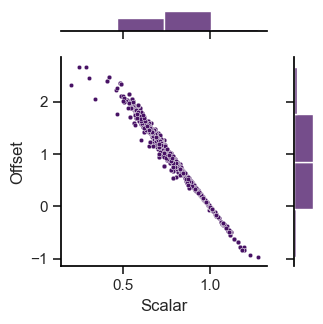

In [22]:
g = sns.jointplot(x="scalar",y="offset",data=df,
    s=10,marginal_kws=dict(bins=4),
    color='#471164FF'
)
g.fig.set_figwidth(3.4)
g.fig.set_figheight(3.4)
plt.ylabel('Offset')
plt.xlabel('Scalar')
plt.tight_layout()
plt.savefig(run+"/plots/offset_vs_scalar.png", bbox_inches='tight')



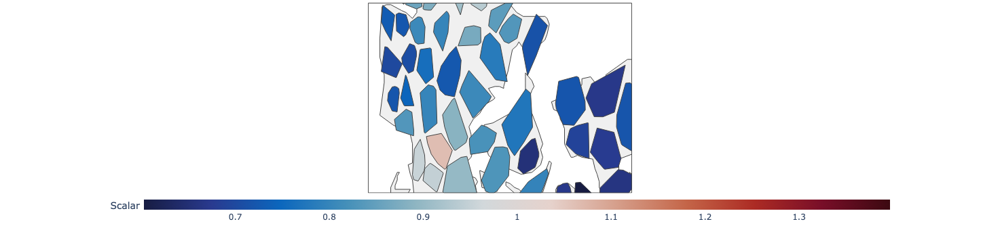

In [214]:
import geopandas as gpd
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["lon"], df["lat"], crs="EPSG:4326"),
)
maps = gdf.dissolve("cluster")
maps['geometry'] = gdf.dissolve("cluster").convex_hull
# res.to_wkt()

fig = px.choropleth(
    maps,
    geojson=maps.geometry,
    locations=maps.index,
    color="scalar",
    color_continuous_scale='balance',
    color_continuous_midpoint=1
)
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),
    width = 465, height = 340,
    coloraxis_colorbar=dict(
        len=0.8,
        yanchor = 'top',
        y=0,
        thickness=15,
        orientation='h',
        title="Scalar"
))
fig.show()

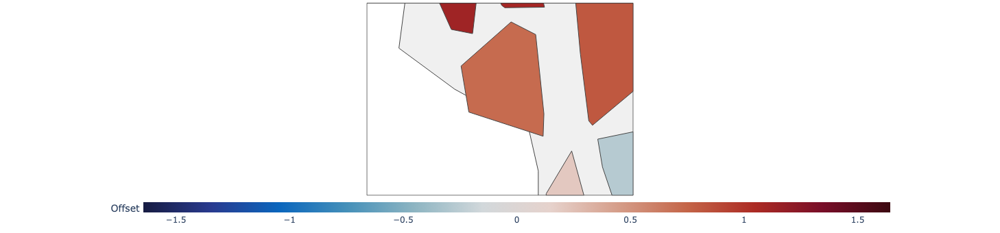

In [215]:
fig = px.choropleth(
    maps,
    geojson=maps.geometry,
    locations=maps.index,
    color="offset",
    color_continuous_scale='balance',
    color_continuous_midpoint=0,
)
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)

fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),
    width = 465, height = 340,
    coloraxis_colorbar=dict(
        len=0.8,
        yanchor = 'top',
        y=0,
        thickness=15,
        orientation='h',
        title="Offset"
))
fig.show()

### Extra Old Functions

In [202]:
# time_res = 'fixed'
# num_clu = 3700
# factors = pd.read_csv(run+'/training/correction-factors/'+country+'_factors_'+time_res+'_'+str(num_clu)+'.csv')
# labels = pd.read_csv(run+'/training/simulated-turbines/DK_clus_info_3700.csv')
# all_factors = labels.merge(factors[['cluster','scalar','offset']], on='cluster')

# upper = 0.98
# lower = 1-upper
# filtered_factors = all_factors[(all_factors["scalar"] < all_factors["scalar"].quantile(upper)) & (all_factors["scalar"] > all_factors["scalar"].quantile(lower)) & (all_factors["offset"] < all_factors["offset"].quantile(upper)) & (all_factors["offset"] > all_factors["offset"].quantile(lower))]

# q = sns.jointplot(x="scalar",y="offset",data=filtered_factors,
#     s=5,marginal_kws=dict(bins=30),
#     color='#471164FF'
# )
# q.fig.set_figwidth(3.4)
# q.fig.set_figheight(3.4)
# plt.ylabel('Offset')
# plt.xlabel('Scalar')
# plt.tight_layout()
# plt.savefig(run+"/plots/offset_vs_scalar.png", bbox_inches='tight')

In [35]:
#### ti explore where clusters may be
# num_clu = 800
# clus_info_plot = cluster_turbines(num_clu, turb_info_train.copy(), False, turb_info.copy())
# clus_info_plot["cluster"] = clus_info_plot["cluster"].astype(str)
# fig = px.scatter_geo(clus_info_plot, lat ='lat',lon ='lon', color = 'cluster')

# fig.update_geos(
#     resolution=50, 
#     center=dict(lon=11.2, lat=56.2),
#     lataxis_range=[54.6, 58], 
#     lonaxis_range=[7,15.5],
#     projection_type='mercator',
#     landcolor=bg_colour
# )
# fig.update_traces(marker=dict(size=5))

# fig.update_layout(
#     margin=dict(l=5, r=5, t=5, b=5),width = 465, height = 340,
#     legend=dict(orientation="v", yanchor="middle", y=0.5, xanchor="center", x=1.1, title="Region", 
#     # bordercolor="Black",borderwidth=1
#     )
# )
# fig.show()

In [ ]:
# THIS IS TO CALCULATE DISTANCE BETWEEN CLUSTERS ALSO THIS OLD ASSIGN NEW CLUSTERS METHOD SEEMDS TO GIVE A SLIGHTLY BETTER ERROR CONFUSED?
def closest_cluster(clus_info, turb_info):
    """
    Assign new turbine/farm to closest cluster found in training.

        Args:
            clus_info (pandas.DataFrame): clustered turbine metadata from training
            turb_info (pandas.DataFrame): turbine metadata for new turbines

        Returns:
            turb_info (pandas.DataFrame): turbine metadata with assigned cluster column
    """
    clus_info['ID'] = clus_info['ID'].astype(str)
    turb_info['ID'] = turb_info['ID'].astype(str)
    
    # finding cluster center
    avg = clus_info.groupby(['cluster'], as_index=False)[['lat','lon']].mean()
    turb_info = pd.DataFrame.merge(clus_info[['ID','cluster']], turb_info, on='ID', how='right')
    turb_info['distance'] = 0

    # find smallest distance between the new turbine and cluster centers
    for i in range(len(turb_info)):
        if np.isnan(turb_info.cluster[i]) == True:
            distances = np.sqrt((avg.lat.values - turb_info.lat[i])**2 + (avg.lon.values - turb_info.lon[i])**2)
            indx = distances.argmin()
            turb_info.distance[i] = distances[indx]
            turb_info.cluster[i] = avg.cluster[indx]

    turb_info = turb_info.reset_index(drop=True)
    return turb_info
    
num_clu = 5
turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
clus_info = pd.read_csv(run+'/training/simulated-turbines/DK_clus_info_'+str(num_clu)+'.csv')
turb_info = closest_cluster(clus_info,turb_info)

turbine_diff = explore_error('turbine-error', run, country, turb_info, [num_clu], ['fixed'], False, 2020)

fig, axes = plt.subplots(1, figsize=(4, 3))
sns.scatterplot(x="distance",y="diff",data=turbine_diff,s=5,color='#471164FF',ax=axes)
plt.tight_layout()

not doing uncorrected
not doing uncorrected


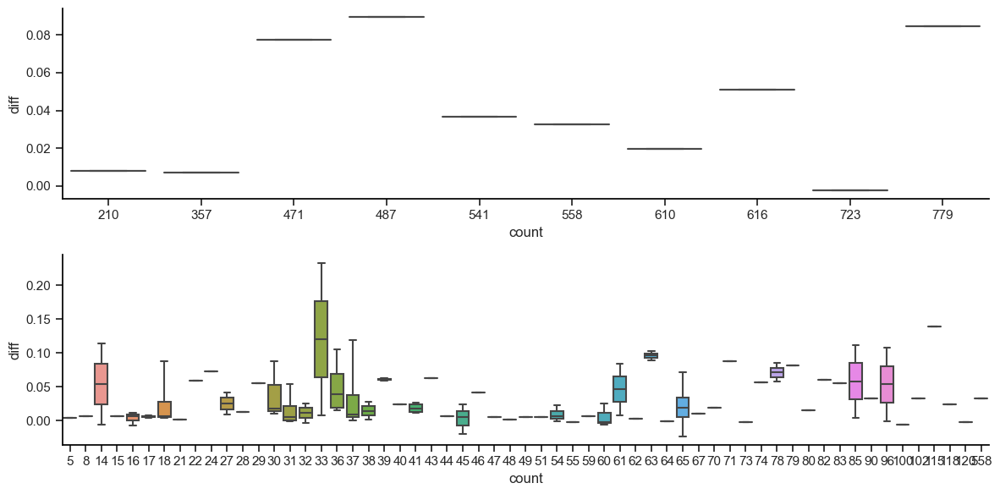

In [181]:
num_clu = 10
num_clu2 = 100

clus_info_1 = cluster_turbines(num_clu, turb_info_train.copy(), False, turb_info.copy())
cluster_diff = explore_error('cluster-error', run, country, clus_info_1, [num_clu], ['fixed'], False, 2020)
clus_info_2 = cluster_turbines(num_clu2, turb_info_train.copy(), False, turb_info.copy())
cluster_diff2 = explore_error('cluster-error', run, country, clus_info_2, [num_clu2], ['fixed'], False, 2020)

fig, axes = plt.subplots(2,1, figsize=(12, 6))
sns.boxplot(data=cluster_diff,x="count", y="diff",showfliers = False,ax=axes[0],whis=(0, 100))
sns.boxplot(data=cluster_diff2,x="count", y="diff",showfliers = False,ax=axes[1],whis=(0, 100))
plt.tight_layout()

In [ ]:
# finding the best cluster result

turb_info.loc[(turb_info['type'] == 'onshore') & (turb_info['In training?'] == 'Yes'), 'In training?'] = 'Existing onshore turbine'
turb_info.loc[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'Yes'), 'In training?'] = 'Existing offshore turbine'
turb_info.loc[(turb_info['type'] == 'onshore') & (turb_info['In training?'] == 'No'), 'In training?'] = 'New onshore turbine'
turb_info.loc[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'No'), 'In training?'] = 'New offshore turbine'
turb_info = turb_info.sort_values('In training?', ascending=False)

train = False
if train == True:
    obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')
    unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_unc_cf.csv', parse_dates=['time'])
else:
    year_test = 2020
    obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
    unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])

all_diff = obs_cf.set_index('time').mean().rename('obs').reset_index()

# all_diff['unc'] = unc_cf.set_index('time').mean().reset_index()[0] - all_diff['obs']


for num_clu in [1,2,700,2000]:
    for time_res in ['fixed']:
        if train == True:
            cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
        else:
            cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])

        col = str(num_clu)#+'_'+time_res
        all_diff[col] = cor_cf.set_index('time').mean().reset_index()[0] - all_diff['obs']

check = all_diff.drop('obs',axis=1).set_index('index')
check2 = all_diff.drop('obs',axis=1).set_index('index')
check['best']=check2.abs().idxmin(axis=1)
check['worst']=check2.abs().idxmax(axis=1)
results = check.reset_index()[['index','best','worst']].dropna()
results.columns = 'ID', 'best', 'worst'

results.loc[results['best'] == 'unc', 'best'] = '0'
turb_info['ID'] = turb_info['ID'].astype(str)
results['ID'] = results['ID'].astype(str)
results['best'] = results['best'].astype(int)
results['worst'] = results['worst'].astype(int)

results = pd.merge(results, turb_info[['ID', 'capacity','type','lat','lon','In training?']], on='ID')


# results_plot = results[(results['type']=='onshore') & (results['In training?']=='Yes') & (results['best']!=0) ]#&(results['best']!=1)]
# print(results_plot.best.value_counts())
# sns.histplot(data=results_plot, x='best',weights=None, stat='percent', kde=True,bins=33, log_scale=True)
# sns.histplot(data=results_plot, x='worst',weights=None, stat='percent', kde=True,bins=33, log_scale=True)

results_plot = results[(results['type']=='onshore')]# &(results['best']!=1)]
print(results_plot.best.value_counts(), results_plot.worst.value_counts())

fig, axes = plt.subplots(1,2, figsize=(10, 4),sharey='all')
sns.histplot(data=results_plot, x='best',weights='capacity', stat='percent', kde=True,bins=30, log_scale=True,hue='In training?',multiple='stack',palette="Set2",legend=True,ax=axes[0])
sns.histplot(data=results_plot, x='worst',weights='capacity', stat='percent', kde=True,bins=30, log_scale=True,hue='In training?',multiple='stack',palette="Set2",legend=True,ax=axes[1])
axes[0].set_title('Best')
axes[1].set_title('Worst')
axes[1].set_xlabel('Number of Clusters ($n_{clu}$)')
axes[0].set_xlabel('Number of Clusters ($n_{clu}$)')
plt.show()

<Axes: xlabel='ID', ylabel='Percent'>

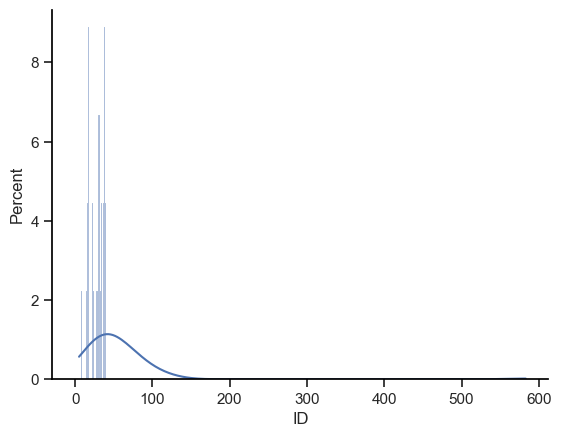

In [169]:
num_clu = 100
label = cluster_turbines(num_clu, turb_info_train.copy(), False, turb_info.copy())
count = lambda x: label.loc[x.index]['ID'].count()
forplot = label.groupby('cluster').agg({'ID': count, 'capacity': np.mean})
# sns.histplot(data=forplot, x='ID', binrange=(0,40), bins=40, weights='capacity', stat='percent')
sns.histplot(data=forplot, x='ID', binrange=(0,40), discrete=True, weights=None, stat='percent', kde=True)

In [ ]:
# fig = px.scatter_geo(
#     filtered_factors,lat='lat',lon='lon', 
#     color = 'scalar',color_continuous_scale='Temps',
#     color_continuous_midpoint=1,
#     # range_color=(0.4,1.2)
# ) 
# fig.update_geos(
#     resolution=50, 
#     center=dict(lon=11.2, lat=56.2),
#     lataxis_range=[54.6, 58], 
#     lonaxis_range=[7,15.5],
#     projection_type='mercator',
#     landcolor=bg_colour
# )
# fig.update_traces(marker=dict(size=10, opacity=0.5))
# fig.update_layout(
#     margin=dict(l=5, r=5, t=5, b=5),
#     width = 465, height = 340,
#     coloraxis_colorbar=dict(
#         len=0.8,
#         yanchor = 'top',
#         y=0,
#         thickness=15,
#         orientation='h'
# ))
# fig.layout.coloraxis.colorbar.title = 'Scalar'
# fig.show()

In [80]:
# def plot_monthly_regional_error(metric, run, country, df_metrics):
#     # metric = 'rmse' # choose between 'mae', 'rmse'
#     base_clu = 1
#     choice_clu = 600
#     choice_clu2 = 3700
#     fig, axes = plt.subplots(3,3, figsize=(12, 12),sharey='all')

#     ix = 0
#     iy = 0
#     boooool = False
#     for i in range(0,9):
#         if i == 3 or i == 6:
#             ix = 0
#             iy += 1
#         if i == 8:
#             boooool = True
#         sns.lineplot(
#             x='month',y=metric,
#             data = df_metrics[(df_metrics['region'] == i) & ((df_metrics['num_clu'] == base_clu) | (df_metrics['num_clu'] == choice_clu) | (df_metrics['num_clu'] == choice_clu2))],
#             hue ="num_clu",style= "time_res",palette="tab10",
#             # hue_order = ['month', 'bimonth', 'season', 'fixed'],
#             style_order= ['fixed'],
#             ax = axes[iy,ix], legend = boooool
#         )

#         axes[iy,ix].set_ylabel('N'+metric.upper())
#         axes[iy,ix].set_xlabel('Month')
#         axes[iy,ix].set_xticks(range(1,13))
#         axes[iy,ix].set_title(r'Region = ' + str(i))
        
#         if i < 2 or i > 2:
#             ix +=1
    
#     # fixing the legend labels and sharing it over whole plot.
#     axes[2,2].get_legend().remove()
#     handles, labels = plt.gca().get_legend_handles_labels()
#     labels = ['$n_{clu}$', '1', '600','3700', '$t_{freq}$','Fixed']
#     plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.5, 0.5))
#     plt.tight_layout()
#     # plt.savefig(run+'/plots/'+country+'_monthly_'+metric+'.png', bbox_inches='tight')
#     return plt.tight_layout()

# type = 'region_month'
# region_month_metrics = explore_error(type, run, country, region_info, [1,600,3700], time_res_list, False, year_test)
# region_month_metrics['region'] = region_month_metrics['region'].astype(int)
# plot_monthly_regional_error('mae', run, country, region_month_metrics)

In [365]:
# 29/02/2024

# def calc_error(type, df_sim, df_obs, turb_info, train=False):
#     if train == True:
#         df_obs = df_obs.pivot(
#                 index=['year','month'], 
#                 columns='ID', 
#                 values='obs').reset_index(drop=True)
#         df_obs['time'] = np.arange(str(2015)+'-01', str(2019+1)+'-01', dtype='datetime64[M]')
#         df_obs['month'] = df_obs.time.dt.month
#         df_obs['year'] = df_obs.time.dt.year
#         df_obs_monthly = df_obs.drop(columns=['time']).groupby(['year','month']).mean().reset_index()
#         df_obs_monthly = df_obs_monthly.melt(id_vars=['year','month'], var_name='ID', value_name='cf')
#     else:
#         df_obs['time'] = pd.to_datetime(df_obs['time'])
#         df_obs['month'] = df_obs.time.dt.month
#         df_obs['year'] = df_obs.time.dt.year
#         df_obs_monthly = df_obs.drop(columns=['time']).set_index('month').reset_index()
#         df_obs_monthly = df_obs_monthly.melt(id_vars=['year','month'], var_name='ID', value_name='cf')
    
#     df_sim['time'] = pd.to_datetime(df_sim['time'])
#     df_sim['month'] = df_sim.time.dt.month
#     df_sim['year'] = df_sim.time.dt.year
#     df_sim_monthly = df_sim.drop(columns=['time']).groupby(['year','month']).mean().reset_index()
#     df_sim_monthly = df_sim_monthly.melt(id_vars=['year','month'], var_name='ID', value_name='cf')

#     turb_info['ID'] = turb_info['ID'].astype(str)
#     df_obs_monthly['ID'] = df_obs_monthly['ID'].astype(str)
#     df_sim_monthly['ID'] = df_sim_monthly['ID'].astype(str)
    
#     merged = pd.merge(df_sim_monthly, df_obs_monthly, on=['ID', 'month', 'year'], suffixes=('_sim', '_obs'))
#     if (type == 'region_year') or (type == 'region_month'):
#         merged = pd.merge(merged, turb_info[['ID', 'capacity','region']], on='ID')
#     else:
#         merged = pd.merge(merged, turb_info[['ID', 'capacity']], on='ID')
    
#     merged['diff'] = merged['cf_sim'] - merged['cf_obs']
#     merged['abdiff'] = np.abs(merged['diff'])
#     merged['sqdiff'] = merged['diff']**2
    
#     merged = merged.dropna(subset=['cf_sim', 'cf_obs', 'capacity']).reset_index(drop=True)

#     def weighted_avg(df, values, weights):
#         return (df[values] * df[weights]).sum() / df[weights].sum()

#     wavg_obs = lambda x: weighted_avg(merged.loc[x.index], 'cf_obs', 'capacity')
#     wavg_sim = lambda x: weighted_avg(merged.loc[x.index], 'cf_sim', 'capacity')

#     if type == 'country_year':
#         averaged = merged.groupby('year').agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim})
#     elif type == 'region_year':
#         averaged = merged.groupby('region').agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim})
#     elif type == 'country_month':
#         averaged = merged.groupby('month').agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim})
#     elif type == 'region_month':
#         averaged = merged.groupby(['region','month']).agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim}).reset_index()

#     averaged['diff'] = averaged['cf_sim'] - averaged['cf_obs']
#     averaged['rmse'] = np.sqrt(averaged['diff']**2)/averaged['cf_obs']
#     averaged['mae'] = np.abs(averaged['diff'])/averaged['cf_obs']
#     return averaged

# def explore_error(metric_type, run, country, turb_info, cluster_list, time_res_list, train=False, *args):
#     rmse_all = []
#     mae_all = []
#     cluster_all = []
#     time_all = []
#     type_all = []
    
    
#     if train == True:
#         obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')
#         unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_unc_cf.csv', parse_dates=['time'])
#     else:
#         year_test = args[0]
#         obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
#         unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
    

#     error = calc_error(metric_type, unc_cf, obs_cf, turb_info, train)
    
#     rmse_all.append(error['rmse'])
#     mae_all.append(error['mae'])
#     cluster_all.append([1]*len(error))
#     time_all.append(['uncorrected']*len(error))
    
#     if metric_type == 'region_month':
#         type2_all = []
#         type_all.append(error['region'])
#         type2_all.append(error['month'])
#     else:
#         type_all.append(error.index)
    
#     for num_clu in cluster_list:
#         for time_res in time_res_list:
#             if train == True:
#                 cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
#             else:
#                 cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
            
#             error = calc_error(metric_type, cor_cf, obs_cf, turb_info, train)
            
#             rmse_all.append(error['rmse'])
#             mae_all.append(error['mae'])
#             cluster_all.append([num_clu]*len(error))
#             time_all.append([time_res]*len(error))
#             if metric_type == 'region_month':
#                 type_all.append(error['region'])
#                 type2_all.append(error['month'])
#             else:
#                 type_all.append(error.index)
    

#     if metric_type == 'region_month':
#         df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(type2_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(rmse_all), np.ravel(mae_all))), 
#                      columns =['region', 'month' ,'num_clu', 'time_res', 'rmse', 'mae'])
#     else:
#         df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(rmse_all), np.ravel(mae_all))), 
#                  columns =[metric_type,'num_clu', 'time_res', 'rmse', 'mae'])

#     return df_metrics
# def plot_overall_error(run, country, df_metrics, name):
#     fig, axes = plt.subplots(1, 2, figsize=(12, 3))
    
#     sns.lineplot(
#         x='num_clu',
#         y='rmse',
#         hue ="time_res",
#         style="time_res",
#         hue_order = ['month', 'bimonth', 'season', 'fixed'],
#         style_order= ['month', 'bimonth', 'season', 'fixed'],
#         data = df_metrics[(df_metrics['time_res'] != 'uncorrected')],
#         ax = axes[0],
#         legend = False
#     )
#     axes[0].set_xscale('log')
#     axes[0].set_ylabel('NRMSE')
#     axes[0].set_xlabel('Number of Clusters ($n_{clu}$)')
#     axes[0].set_xticks([1, 10, 100,1000])
#     axes[0].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    
#     sns.lineplot(
#         x='num_clu',
#         y='mae',
#         hue ="time_res",
#         style= "time_res",
#         hue_order = ['month', 'bimonth', 'season', 'fixed'],
#         style_order= ['month', 'bimonth', 'season', 'fixed'],
#         data = df_metrics[(df_metrics['time_res'] != 'uncorrected')],
#         ax = axes[1],
#         legend = True
#     )
    
#     axes[1].set_xscale('log')
#     axes[1].set_ylabel('NMAE')
#     axes[1].set_xlabel('$n_{clu}$')
#     axes[1].set_xticks([1, 10, 100,1000])
#     axes[1].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    
#     # fixing the legend labels and sharing it over whole plot.
#     axes[1].get_legend().remove()
#     handles, labels = plt.gca().get_legend_handles_labels()
#     labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Fixed'] # renaming labels
#     plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.3, 0.5), title='$t_{freq}$')
#     plt.tight_layout()
#     plt.savefig(run+'/plots/'+country+'_'+name+'_error.png', bbox_inches='tight')
#     return print("Saved to "+str(run+'/plots/'+country+'_'+name+'_error.png')+"\n")

# type = 'country_year'
# country_year_metrics = explore_error(type, run, country, turb_info, cluster_list, time_res_list, False, year_test)
# plot_overall_error(run, country, country_year_metrics, type)

In [ ]:
# PLOTTING THE MONTHLY VARIATION IN BIAS FACTORS

# month_factors = all_factors.groupby(['cluster', 'month'], as_index=False)[['lat','lon','scalar','offset']].mean()


# # plotting
# fig = px.scatter_geo(
#     month_factors,
#     lat='lat',
#     lon='lon', 
#     color = 'scalar',
#     hover_data=['scalar'],
#     facet_col='month',
#     facet_col_wrap=3,
#     color_continuous_scale='viridis', 
# ) 

# fig.update_geos(
#     resolution=50, 
#     center=dict(lon=11.2, lat=56),
#     lataxis_range=[54.8, 58.5], 
#     lonaxis_range=[7,15.5],
#     projection_type='mercator',
# )
# fig.update_traces(marker=dict(size=3.5, opacity=1))
# fig.update_layout(width = 800, height = 800)

# fig.show()


In [ ]:
#### monthly old
# def calc_monthly_error(df_sim, df_obs, turb_info):
#     df_obs['time'] = pd.to_datetime(df_obs['time'])
#     df_obs['month'] = df_obs.time.dt.month
#     df_obs_monthly = df_obs.drop(columns=['time']).set_index('month').reset_index()
#     df_obs_monthly = df_obs_monthly.melt(id_vars=['month'], var_name='ID', value_name='cf')
    
#     df_sim['time'] = pd.to_datetime(df_sim['time'])
#     df_sim['month'] = df_sim.time.dt.month
#     df_sim_monthly = df_sim.drop(columns=['time']).groupby('month').mean().reset_index()
#     df_sim_monthly = df_sim_monthly.melt(id_vars=['month'], var_name='ID', value_name='cf')

#     turb_info['ID'] = turb_info['ID'].apply(str)
    
#     merged = pd.merge(df_sim_monthly, df_obs_monthly, on=['ID', 'month'], suffixes=('_sim', '_obs'))
#     merged = pd.merge(merged, turb_info[['ID', 'capacity']], on='ID')
    
#     merged['diff'] = merged['cf_obs'] - merged['cf_sim']
#     merged['abdiff'] = np.abs(merged['diff'])
#     merged['sqdiff'] = merged['diff']**2
    
#     merged = merged.dropna(subset=['cf_sim', 'cf_obs', 'capacity'])

#     def weighted_avg(df, values, weights):
#         return (df[values] * df[weights]).sum() / df[weights].sum()

#     wavg = lambda x: weighted_avg(merged.loc[x.index], 'sqdiff', 'capacity')
#     wavg2 = lambda x: weighted_avg(merged.loc[x.index], 'abdiff', 'capacity')
#     wavg3 = lambda x: weighted_avg(merged.loc[x.index], 'cf_obs', 'capacity')

#     error = merged.groupby('month').agg({"sqdiff": wavg, 'abdiff': wavg2, 'cf_obs': wavg3})
#     # return error
#     rmse = (np.sqrt(error['sqdiff'])/error['cf_obs']).rename('rmse')
#     mae = (error['abdiff']/error['cf_obs']).rename('mae')

#     return rmse, mae


# USING THE YEARLY ERROR LIKE SIMON SUGGESTED
# def calc_yearly_error(df_sim, df_obs, turb_info, train=False):
#     if train == True:
#         df_obs = df_obs.pivot(
#                 index=['year','month'], 
#                 columns='ID', 
#                 values='obs').reset_index(drop=True)
#         df_obs['time'] = np.arange(str(2015)+'-01', str(2019+1)+'-01', dtype='datetime64[M]')
#         df_obs['month'] = df_obs.time.dt.month
#         df_obs_monthly = df_obs.drop(columns=['time']).groupby('month').mean()
        
#     else:
#         df_obs['time'] = pd.to_datetime(df_obs['time'])
#         df_obs['month'] = df_obs.time.dt.month
#         df_obs_monthly = df_obs.drop(columns=['time']).set_index('month')
    
#     df_sim['time'] = pd.to_datetime(df_sim['time'])
#     df_sim['month'] = df_sim.time.dt.month
#     df_sim_monthly = df_sim.drop(columns=['time']).groupby('month').mean()
    
#     df_sim_yearly = df_sim_monthly.mean().reset_index(name='CF')
#     df_sim_yearly.columns = 'ID', 'CF'
#     df_sim_yearly['ID'] = df_sim_yearly['ID'].apply(str)
    
#     df_obs_yearly = df_obs_monthly.mean().reset_index(name='CF')
#     df_obs_yearly.columns = 'ID', 'CF'
#     df_obs_yearly['ID'] = df_obs_yearly['ID'].apply(str)
    
#     turb_info['ID'] = turb_info['ID'].apply(str)
    
#     merged = pd.merge(df_sim_yearly, df_obs_yearly, on='ID', suffixes=('_sim', '_obs'))
#     merged = pd.merge(merged, turb_info[['ID', 'capacity']], on='ID')
    
#     merged['diff'] = merged['CF_sim'] - merged['CF_obs']
    
#     merged = merged.dropna(subset=['CF_sim', 'CF_obs', 'capacity'])

#     rmse = np.sqrt(np.average(np.square(merged['diff']), weights=merged['capacity']))
#     mae = np.average(np.abs(merged['diff']), weights=merged['capacity'])
#     return rmse, mae

# def calc_regional_error(df_sim, df_obs, turb_info, train=False):
#     if train == True:
#         df_obs = obs_cf_train.pivot(
#                 index=['year','month'], 
#                 columns='ID', 
#                 values='obs').reset_index(drop=True)
#         df_obs['time'] = np.arange(str(2015)+'-01', str(2019+1)+'-01', dtype='datetime64[M]')
#         df_obs['month'] = df_obs.time.dt.month
#         df_obs_monthly = df_obs.drop(columns=['time']).groupby('month').mean()
        
#     else:
#         df_obs['time'] = pd.to_datetime(df_obs['time'])
#         df_obs['month'] = df_obs.time.dt.month
#         df_obs_monthly = df_obs.drop(columns=['time']).set_index('month')
    
#     df_sim['time'] = pd.to_datetime(df_sim['time'])
#     df_sim['month'] = df_sim.time.dt.month
#     df_sim_monthly = df_sim.drop(columns=['time']).groupby('month').mean()
    
#     df_sim_yearly = df_sim_monthly.mean().reset_index(name='cf')
#     df_sim_yearly.columns = 'ID', 'cf'
#     df_sim_yearly['ID'] = df_sim_yearly['ID'].apply(str)
    
#     df_obs_yearly = df_obs_monthly.mean().reset_index(name='cf')
#     df_obs_yearly.columns = 'ID', 'cf'
#     df_obs_yearly['ID'] = df_obs_yearly['ID'].apply(str)
    
#     turb_info['ID'] = turb_info['ID'].apply(str)
    
#     merged = pd.merge(df_sim_yearly, df_obs_yearly, on='ID', suffixes=('_sim', '_obs'))
#     merged = pd.merge(merged, turb_info[['ID', 'capacity','region']], on='ID')

#     merged['diff'] = merged['cf_obs'] - merged['cf_sim']
#     merged['abdiff'] = np.abs(merged['diff'])
#     merged['sqdiff'] = merged['diff']**2
    
#     merged = merged.dropna(subset=['cf_sim', 'cf_obs', 'capacity'])

#     def weighted_avg(df, values, weights):
#         return (df[values] * df[weights]).sum() / df[weights].sum()

#     wavg = lambda x: weighted_avg(merged.loc[x.index], 'sqdiff', 'capacity')
#     wavg2 = lambda x: weighted_avg(merged.loc[x.index], 'abdiff', 'capacity')
#     wavg3 = lambda x: weighted_avg(merged.loc[x.index], 'cf_obs', 'capacity')

#     error = merged.groupby('region').agg({"sqdiff": wavg, 'abdiff': wavg2, 'cf_obs': wavg3})
#     # return error
#     rmse = (np.sqrt(error['sqdiff'])/error['cf_obs']).rename('rmse')
#     mae = (error['abdiff']/error['cf_obs']).rename('mae')
#     return rmse, mae


# def calc_regional_error2(df_sim, df_obs, turb_info):
#     df_obs['time'] = pd.to_datetime(df_obs['time'])
#     df_obs['month'] = df_obs.time.dt.month
#     df_obs_monthly = df_obs.drop(columns=['time']).set_index('month').reset_index()
#     df_obs_monthly = df_obs_monthly.melt(id_vars=['month'], var_name='ID', value_name='cf')
    
#     df_sim['time'] = pd.to_datetime(df_sim['time'])
#     df_sim['month'] = df_sim.time.dt.month
#     df_sim_monthly = df_sim.drop(columns=['time']).groupby('month').mean().reset_index()
#     df_sim_monthly = df_sim_monthly.melt(id_vars=['month'], var_name='ID', value_name='cf')

#     turb_info['ID'] = turb_info['ID'].apply(str)
    
#     merged = pd.merge(df_sim_monthly, df_obs_monthly, on=['ID', 'month'], suffixes=('_sim', '_obs'))
#     merged = pd.merge(merged, turb_info[['ID', 'capacity','region']], on='ID')
    
#     merged['diff'] = merged['cf_obs'] - merged['cf_sim']
#     merged['abdiff'] = np.abs(merged['diff'])
#     merged['sqdiff'] = merged['diff']**2
    
#     merged = merged.dropna(subset=['cf_sim', 'cf_obs', 'capacity'])

#     def weighted_avg(df, values, weights):
#         return (df[values] * df[weights]).sum() / df[weights].sum()

#     wavg = lambda x: weighted_avg(merged.loc[x.index], 'sqdiff', 'capacity')
#     wavg2 = lambda x: weighted_avg(merged.loc[x.index], 'abdiff', 'capacity')
#     wavg3 = lambda x: weighted_avg(merged.loc[x.index], 'cf_obs', 'capacity')

#     error = merged.groupby('region').agg({"sqdiff": wavg, 'abdiff': wavg2, 'cf_obs': wavg3})

#     rmse = (np.sqrt(error['sqdiff'])/error['cf_obs']).rename('rmse')
#     mae = (error['abdiff']/error['cf_obs']).rename('mae')

#     return rmse, mae


# def test_regional_error(run, year_test, country, turb_info, cluster_list, time_res_list=['yearly', 'season', 'bimonth', 'month']):
#     rmse_all = []
#     mae_all = []
#     cluster_all = []
#     time_all = []
#     regional_all = []

#     obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
#     unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
#     rmse, mae = calc_regional_error2(unc_cf, obs_cf, turb_info)

#     rmse_all.append(rmse)
#     mae_all.append(mae)
#     cluster_all.append([1]*len(rmse))
#     time_all.append(['uncorrected']*len(rmse))
#     regional_all.append(rmse.index)
    
#     for num_clu in cluster_list:
#         for time_res in time_res_list:
#             cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
#             rmse, mae = calc_regional_error2(cor_cf, obs_cf, turb_info)
            
#             rmse_all.append(rmse)
#             mae_all.append(mae)
#             cluster_all.append([num_clu]*len(rmse))
#             time_all.append([time_res]*len(rmse))
#             regional_all.append(rmse.index)
    
    
#     df_metrics = pd.DataFrame(list(zip(np.ravel(regional_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(rmse_all), np.ravel(mae_all))), 
#                  columns =['region','num_clu', 'time_res', 'rmse', 'mae'])

#     return df_metrics


# def plot_regional_error(run, df_metrics, name):
#     fig, axes = plt.subplots(1, 2, figsize=(12, 3))
    
#     sns.lineplot(
#         x='region',y='rmse',
#         data = df_metrics[((df_metrics['time_res'] == 'season') | (df_metrics['time_res'] == 'yearly')) & ((df_metrics['num_clu'] == 1) | (df_metrics['num_clu'] == 500) | (df_metrics['num_clu'] == 3000))],
#         hue ="num_clu",style="time_res",palette="tab10",
#         ax = axes[0],
#         legend = False
#     )
#     axes[0].set_ylabel('RMSE')
#     axes[0].set_xlabel('Region')
    
#     sns.lineplot(
#         x='region',y='mae',
#         data = df_metrics[((df_metrics['time_res'] == 'season') | (df_metrics['time_res'] == 'yearly')) & ((df_metrics['num_clu'] == 1) | (df_metrics['num_clu'] == 500) | (df_metrics['num_clu'] == 3000))],
#         hue ="num_clu",style="time_res",palette="tab10",
#         ax = axes[1],
#         legend = True
#     )
    
#     axes[1].set_ylabel('MAE')
#     axes[1].set_xlabel('Region')
    
#     # fixing the legend labels and sharing it over whole plot.
#     axes[1].get_legend().remove()
#     handles, labels = plt.gca().get_legend_handles_labels()
#     print(labels)
#     labels = ['$n_{clu}$', '1', '500','3000', '$t_{freq}$', 'Fixed', 'Seasonal']
#     plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.3, 0.5))
#     plt.tight_layout()
#     # plt.savefig(run+'/plots/'+country+'_'+name+'_error.png', bbox_inches='tight')
#     return plt.tight_layout()

In [ ]:
# def region_bounds(region_info):
#     region_coord = region_info.groupby('region')[['lat','lon']].mean().reset_index()
#     top = []
#     bot = []
#     left = []
#     right = []
#     lat = []
#     lon = []
#     for i in region_coord['region']:
#         top.append(region_info.where(region_info['region']==i)['lat'].max())
#         bot.append(region_info.where(region_info['region']==i)['lat'].min())
#         left.append(region_info.where(region_info['region']==i)['lon'].min())
#         right.append(region_info.where(region_info['region']==i)['lon'].max())

#         lat.append(region_info.where(region_info['region']==i)['lat'].max())
#         lat.append(region_info.where(region_info['region']==i)['lat'].max())
#         lat.append(region_info.where(region_info['region']==i)['lat'].min())
#         lat.append(region_info.where(region_info['region']==i)['lat'].min())
#         lat.append(region_info.where(region_info['region']==i)['lat'].max())
        
#         lon.append(region_info.where(region_info['region']==i)['lon'].max())
#         lon.append(region_info.where(region_info['region']==i)['lon'].min())
#         lon.append(region_info.where(region_info['region']==i)['lon'].min())
#         lon.append(region_info.where(region_info['region']==i)['lon'].max())
#         lon.append(region_info.where(region_info['region']==i)['lon'].max())

#         lat.append(None)
#         lon.append(None)
    
#     region_coord['top'] = top
#     region_coord['bot'] = bot
#     region_coord['left'] = left
#     region_coord['right'] = right
#     return region_coord, lat, lon
    
# attempt to add a border
# coords, lat, lon = region_bounds(region_info)
# fig.add_scattergeo(
#     lat = lat,
#     lon = lon,
#     mode = 'lines',
#     )
# fig.update_traces(marker=dict(size=5))

In [ ]:
## INTERPOLATING THE SCALAR AND OFFSET TO SHOW SPATIAL PATTERNS THIS WILL BE USEFUL FOR OTEHR STUF



from geocube.api.core import make_geocube
from geocube.rasterize import rasterize_points_griddata
from functools import partial

gdf = gpd.GeoDataFrame(
    all_factors, geometry=gpd.points_from_xy(all_factors['lon'], all_factors['lat']), crs="EPSG:4326",
)

denmark = gpd.read_file(run+"wind_data/DK/shape/DNK_adm0.shp")

geo_grid_cubic = make_geocube(
    gdf,
    measurements=["scalar", "offset"],
    resolution=(0.1, 0.1),
    rasterize_function=partial(rasterize_points_griddata, method="linear"),
    interpolate_na_method="nearest",
)


fig, ax = plt.subplots()

geo_grid_cubic.scalar.plot.imshow()

denmark.boundary.plot(
    ax=ax,
    alpha=0.7,
    color="black"
)

ax.set_axis_off()


fig, ax = plt.subplots()

geo_grid_cubic.offset.plot.imshow()

denmark.boundary.plot(
    ax=ax,
    alpha=0.7,
    color="black"
)

# ax.set_axis_off()

In [50]:
# # MINE FOR THE NEW ERRORS 14/02/2024
# def monthly_cf(df, value):
#     df = df.groupby(pd.Grouper(key='time',freq='M')).mean()
#     df = df.transpose().reset_index()
#     df.columns = ['ID','1','2','3','4','5','6','7','8','9','10','11','12']
#     return df.set_index('ID')

# def rmse_total(df, df_obs,turb_info):
#     df = monthly_cf(df, 'sim')
#     df_obs = monthly_cf(df_obs, 'obs')
#     diff = (df_obs.mean(axis=1) - df.mean(axis=1))**2
#     diff = diff.reset_index()
    
#     diff["ID"] = diff["ID"].astype(str)
#     turb_info["ID"] = turb_info["ID"].astype(str)
#     error = pd.merge(diff, turb_info[['ID','capacity']], on=['ID'], how='left')
#     error.columns = ['ID','error','capacity']

#     def weighted_avg(df, values, weights):
#             return (df[values] * df[weights]).sum() / df[weights].sum()
    
#     wavg = lambda x: weighted_avg(error.loc[x.index], 'error', 'capacity')
    
#     rmse = np.sqrt(error.agg({'error': wavg}))
#     return rmse.error

# def mae_total(df, df_obs,turb_info):
#     df = monthly_cf(df, 'sim')
#     df_obs = monthly_cf(df_obs, 'obs')
#     diff = np.abs(df_obs.mean(axis=1) - df.mean(axis=1))
#     diff = diff.reset_index()
    
#     diff["ID"] = diff["ID"].astype(str)
#     turb_info["ID"] = turb_info["ID"].astype(str)
#     error = pd.merge(diff, turb_info[['ID','capacity']], on=['ID'], how='left')
#     error.columns = ['ID','error','capacity']

#     def weighted_avg(df, values, weights):
#             return (df[values] * df[weights]).sum() / df[weights].sum()
    
#     wavg = lambda x: weighted_avg(error.loc[x.index], 'error', 'capacity')
    
#     rmse = error.agg({'error': wavg})
#     return rmse.error


# cf_obs = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
# cf_unc = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')

# rmse_all = []
# mae_all = []
# cluster_all = []
# time_all = []

# rmse = rmse_monthly(cf_unc, cf_obs, turb_info)
# mae = mae_monthly(cf_unc, cf_obs, turb_info)

# rmse_all.append(rmse)
# mae_all.append(mae)
# cluster_all.append(1)
# time_all.append('uncorrected')

# for num_clu in cluster_list:
#     for time_res in time_res_list:
#         cf_cor = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
#         rmse = rmse_monthly(cf_cor, cf_obs, turb_info)
#         mae = mae_monthly(cf_cor, cf_obs, turb_info)
        
#         rmse_all.append(rmse)
#         mae_all.append(mae)
#         cluster_all.append(num_clu)
#         time_all.append(time_res)


# df_metrics = pd.DataFrame(list(zip(np.ravel(cluster_all), np.ravel(time_all), np.ravel(rmse_all), np.ravel(mae_all))), 
#              columns =['num_clu', 'time_res', 'rmse', 'mae'])


# ### ATTEMPT TO LOOK AT MONTHLY CF

# def monthly_cf(df, value):
#     df = df.groupby(pd.Grouper(key='time',freq='M')).mean()
#     df = df.transpose().reset_index()
#     df.columns = ['ID','1','2','3','4','5','6','7','8','9','10','11','12']
#     return df.set_index('ID')

# def rmse_monthly(df, df_obs,turb_info):
#     df = monthly_cf(df, 'sim')
#     df_obs = monthly_cf(df_obs, 'obs')
#     diff = (df_obs - df)**2
#     diff = diff.reset_index()
#     error = diff.melt(
#         id_vars=["ID"], # adding in turbine ID for merging
#         var_name="month", 
#         value_name='error'
#     )
    
#     error["ID"] = error["ID"].astype(str)
#     turb_info["ID"] = turb_info["ID"].astype(str)
#     error = pd.merge(error, turb_info[['ID','capacity']], on=['ID'], how='left')

#     def weighted_avg(df, values, weights):
#             return (df[values] * df[weights]).sum() / df[weights].sum()

#     wavg = lambda x: weighted_avg(error.loc[x.index], 'error', 'capacity')

#     error = error.groupby('month').agg({"error": wavg})
#     rmse = np.sqrt(error)
#     return rmse.reset_index()

# def mae_monthly(df, df_obs,turb_info):
#     df = monthly_cf(df, 'sim')
#     df_obs = monthly_cf(df_obs, 'obs')
#     diff = np.abs(df_obs - df)
#     diff = diff.reset_index()
#     error = diff.melt(
#         id_vars=["ID"], # adding in turbine ID for merging
#         var_name="month", 
#         value_name='error'
#     )
    
#     error["ID"] = error["ID"].astype(str)
#     turb_info["ID"] = turb_info["ID"].astype(str)
#     error = pd.merge(error, turb_info[['ID','capacity']], on=['ID'], how='left')

#     def weighted_avg(df, values, weights):
#             return (df[values] * df[weights]).sum() / df[weights].sum()

#     wavg = lambda x: weighted_avg(error.loc[x.index], 'error', 'capacity')

#     error = error.groupby('month').agg({"error": wavg})
#     mae = error
#     return mae.reset_index()

# cf_obs = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
# cf_unc = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')

# rmse_all = []
# mae_all = []
# cluster_all = []
# time_all = []
# month_all = []


# rmse = rmse_monthly(cf_unc, cf_obs, turb_info)
# mae = mae_monthly(cf_unc, cf_obs, turb_info)

# rmse_all.append(rmse.error)
# mae_all.append(mae.error)
# cluster_all.append([1]*12)
# time_all.append(['uncorrected']*12)
# month_all.append(rmse.month)

# for num_clu in cluster_list:
#     for time_res in time_res_list:
#         cf_cor = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
#         rmse = rmse_monthly(cf_cor, cf_obs, turb_info)
#         mae = mae_monthly(cf_cor, cf_obs, turb_info)
        
#         rmse_all.append(rmse.error)
#         mae_all.append(mae.error)
#         cluster_all.append([num_clu]*12)
#         time_all.append([time_res]*12)
#         month_all.append(rmse.month)


# df_metrics = pd.DataFrame(list(zip(np.ravel(month_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(rmse_all), np.ravel(mae_all))), 
#              columns =['month','num_clu', 'time_res', 'rmse', 'mae'])


# month_metrics = df_metrics
# month_metrics['month'] = month_metrics['month'].astype(int)
# month_metrics= month_metrics.sort_values('month').reset_index(drop=True)
# # month_metrics['time_res'] = month_metrics['time_res'].astype(pd.StringDtype())
# month_metrics
# # month_metrics[(month_metrics['num_clu'] == choice2) & (month_metrics['time_res'] != 'uncorrected')]


# choice = 600 # the number of clusters you would like to analyse
# choice2 = 1 # secondary choice for comparison
# time_res = 'yearly' # choose between 'year', 'season', 'two_month', 'month'
# metric = 'rmse' # choose between 'MAE', 'ME', 'RMSE'

# fig, axes = plt.subplots(1, 2, figsize=(12, 3),sharey='all')

# sns.lineplot(
#     x="month",
#     y=metric,
#     data = month_metrics[(month_metrics['num_clu'] == choice2) & (month_metrics['time_res'] != 'uncorrected')],
#     hue ="time_res",
#     style= "time_res",
#     hue_order = ['month', 'bimonth', 'season', 'yearly'],
#     style_order= ['month', 'bimonth', 'season', 'yearly'],
#     ax = axes[0],
#     legend = False
# )



# sns.lineplot(
#     x="month",
#     y=metric,
#     data = month_metrics[(month_metrics['num_clu'] == choice)],
#     hue ="time_res",
#     style= "time_res",
#     hue_order = ['month', 'bimonth', 'season', 'yearly'],
#     style_order= ['month', 'bimonth', 'season', 'yearly'],
#     ax = axes[1],
#     legend = True
# )

# axes[0].set_ylabel(metric)
# axes[0].set_xlabel('Month')
# # axes[0].set_xticks(range(1,13))
# axes[0].set_title("No. of Clusters: "+str(choice2))

# axes[1].set_ylabel(metric)
# axes[1].set_xlabel('Month')
# # axes[1].set_xticks(range(1,13))
# axes[1].set_title("No. of Clusters: "+str(choice))


# # fixing the legend labels and sharing it over whole plot.
# # axes[1].get_legend().remove()
# # handles, labels = plt.gca().get_legend_handles_labels()
# # labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Yearly'] # renaming labels
# # plt.legend(handles, labels, ncol=1, loc='right',bbox_to_anchor=(1.3, 0.5), title='Time Resolution')
# # plt.savefig(run+"plots/"+country+"_temporal_error.png", bbox_inches='tight')
# plt.tight_layout()